<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Sat Feb 24 16:28:59 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   45C    P0              53W / 350W |      4MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 5*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid-1,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/4)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

1000.0
CPU times: user 9min 8s, sys: 0 ns, total: 9min 8s
Wall time: 9min 9s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

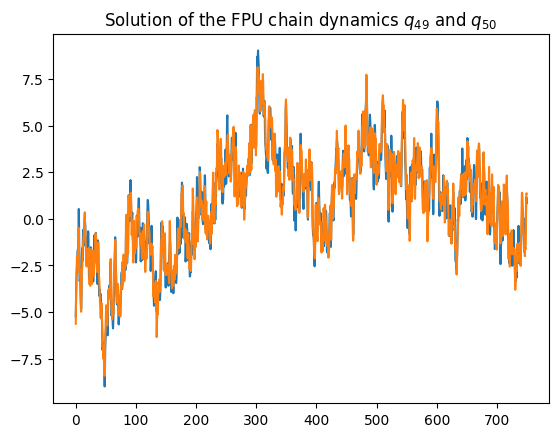

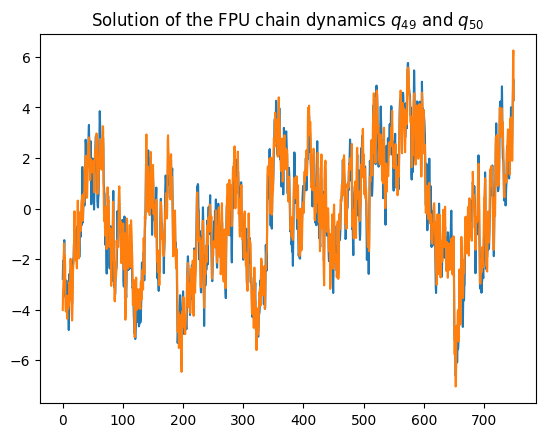

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


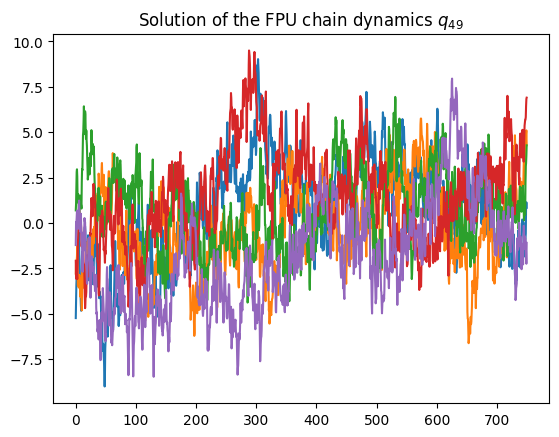

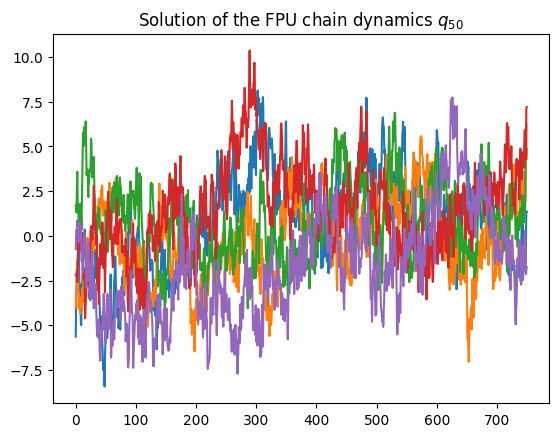

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,2*batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 2)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 2), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 2]) torch.float32
The torch validation size is torch.Size([800, 400, 2]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


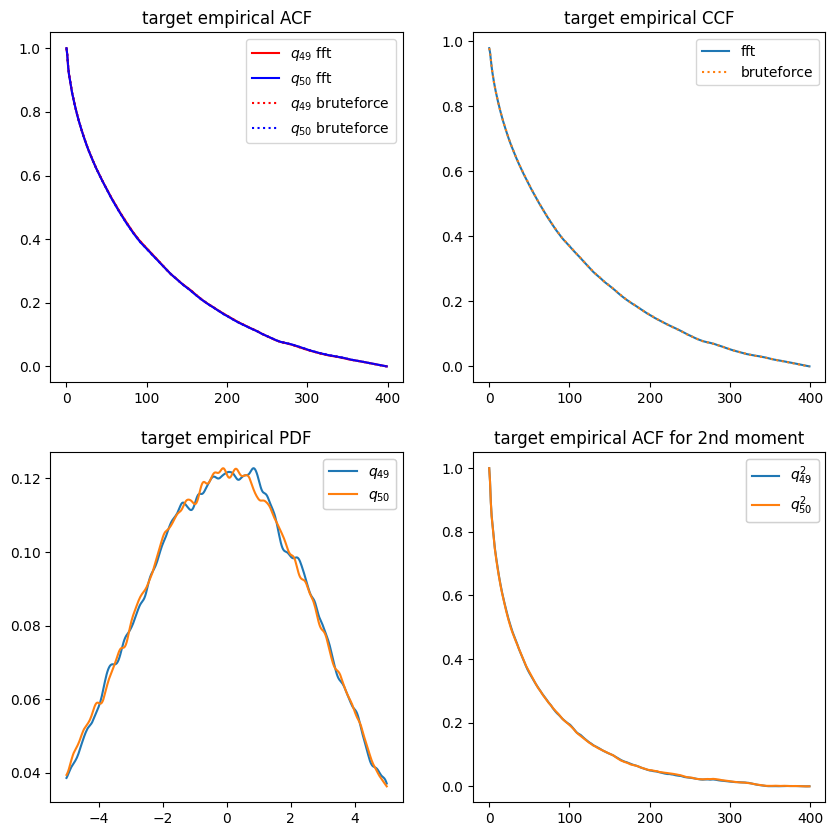

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(x_grid,loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

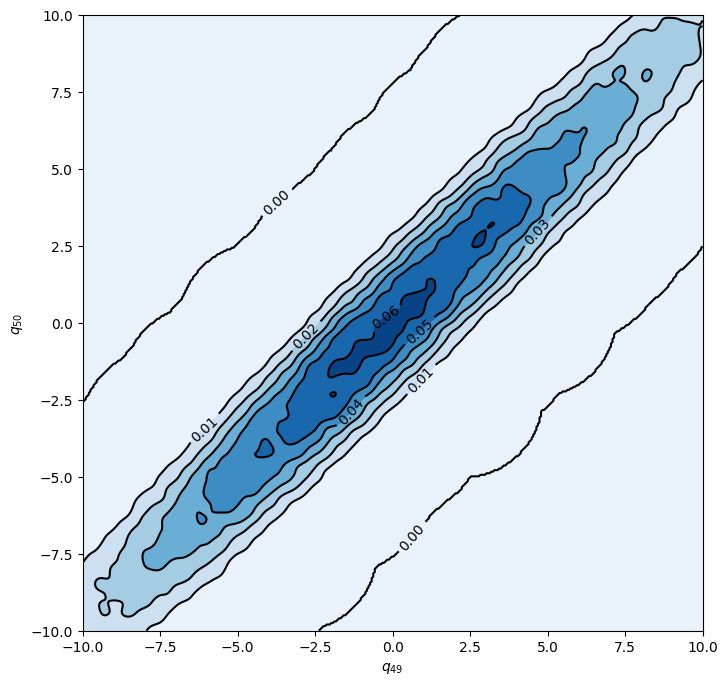

In [14]:
xmin, xmax = -10, 10
ymin, ymax = -10, 10

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

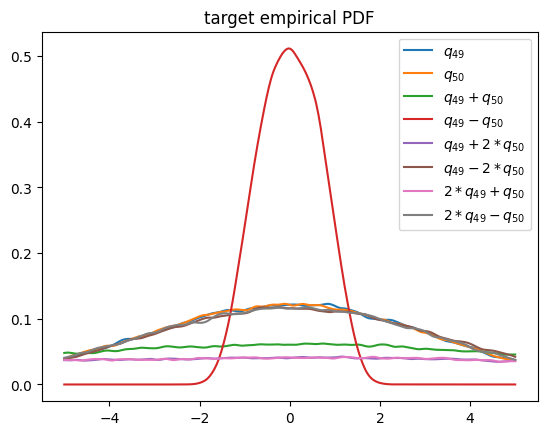

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
# x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [66]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)


        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.Adam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(.5).float()
        self.x_pdf2_s = torch.tensor(.5).float()
        self.x_acf2_s = torch.tensor(.5).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [67]:
### Defining SINN model
net = SINN(2, 150, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [68]:
model = Model(net=net)

In [69]:
model_type = 1

In [70]:
model.train()

[0]-th step loss: 0.8624, 0.8350, acf: 0.10027, ccf: 0.10811, pdf: 0.29310, pdf2: 0.28992, acf2: 0.04359
[50]-th step loss: 0.1332, 0.1346, acf: 0.05320, ccf: 0.05310, pdf: 0.00775, pdf2: 0.00547, acf2: 0.01508
[100]-th step loss: 0.0233, 0.0270, acf: 0.01102, ccf: 0.01099, pdf: 0.00087, pdf2: 0.00098, acf2: 0.00316
[150]-th step loss: 0.0422, 0.0429, acf: 0.01449, ccf: 0.01520, pdf: 0.00829, pdf2: 0.00400, acf2: 0.00088
[200]-th step loss: 0.0415, 0.0394, acf: 0.01316, ccf: 0.01388, pdf: 0.00828, pdf2: 0.00371, acf2: 0.00033
[250]-th step loss: 0.0411, 0.0413, acf: 0.01426, ccf: 0.01476, pdf: 0.00828, pdf2: 0.00373, acf2: 0.00023
[300]-th step loss: 0.0464, 0.0324, acf: 0.00945, ccf: 0.00941, pdf: 0.00829, pdf2: 0.00442, acf2: 0.00081
[350]-th step loss: 0.0644, 0.0700, acf: 0.02519, ccf: 0.02512, pdf: 0.00829, pdf2: 0.00913, acf2: 0.00225
[400]-th step loss: 0.0441, 0.0440, acf: 0.01550, ccf: 0.01587, pdf: 0.00829, pdf2: 0.00418, acf2: 0.00015
[450]-th step loss: 0.0532, 0.0480, acf:

[3850]-th step loss: 0.0266, 0.0316, acf: 0.00933, ccf: 0.00931, pdf: 0.00829, pdf2: 0.00406, acf2: 0.00062
[3900]-th step loss: 0.0226, 0.0278, acf: 0.00739, ccf: 0.00739, pdf: 0.00829, pdf2: 0.00372, acf2: 0.00099
[3950]-th step loss: 0.0220, 0.0237, acf: 0.00474, ccf: 0.00478, pdf: 0.00829, pdf2: 0.00375, acf2: 0.00210
[4000]-th step loss: 0.0232, 0.0211, acf: 0.00284, ccf: 0.00286, pdf: 0.00829, pdf2: 0.00377, acf2: 0.00334
[4050]-th step loss: 0.0225, 0.0239, acf: 0.00450, ccf: 0.00448, pdf: 0.00829, pdf2: 0.00479, acf2: 0.00182
[4100]-th step loss: 0.0301, 0.0236, acf: 0.00020, ccf: 0.00021, pdf: 0.00829, pdf2: 0.00512, acf2: 0.00979
[4150]-th step loss: 0.0235, 0.0235, acf: 0.00121, ccf: 0.00111, pdf: 0.00829, pdf2: 0.00419, acf2: 0.00874
[4200]-th step loss: 0.0210, 0.0265, acf: 0.00025, ccf: 0.00026, pdf: 0.00877, pdf2: 0.00383, acf2: 0.01338
[4250]-th step loss: 0.0162, 0.0152, acf: 0.00056, ccf: 0.00056, pdf: 0.00675, pdf2: 0.00327, acf2: 0.00401
[4300]-th step loss: 0.0122,

In [71]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [72]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    
#     plt.loglog(model.Step, model.T_error,'k',label='Training error')
#     plt.loglog(model.Step, model.V_error,'k--')
#     plt.loglog(model.Step, model.T_acf,'r',label='acf error')
#     plt.loglog(model.Step, model.V_acf,'r--')
#     plt.loglog(model.Step, model.T_ccf,'b',label='ccf error')
#     plt.loglog(model.Step, model.V_ccf,'b--')
#     plt.loglog(model.Step, model.T_pdf,'y',label='pdf error')
#     plt.loglog(model.Step, model.V_pdf,'y--')
#     plt.loglog(model.Step, model.T_pdf2,'m',label='pdf2 error')
#     plt.loglog(model.Step, model.V_pdf2,'m--')
#     plt.loglog(model.Step, model.T_acf2,'g',label='acf2 error')
#     plt.loglog(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [73]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [74]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

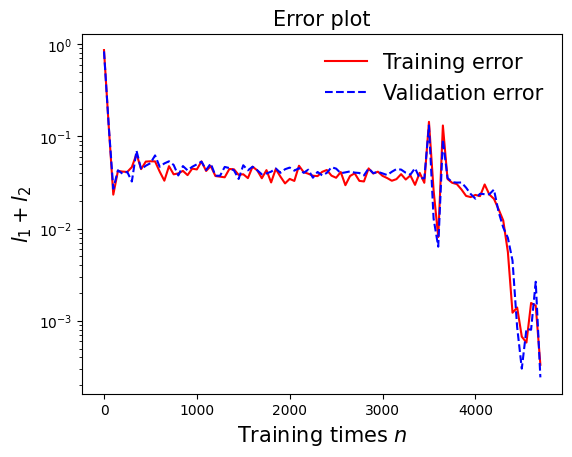

In [75]:
draw_loss(model)

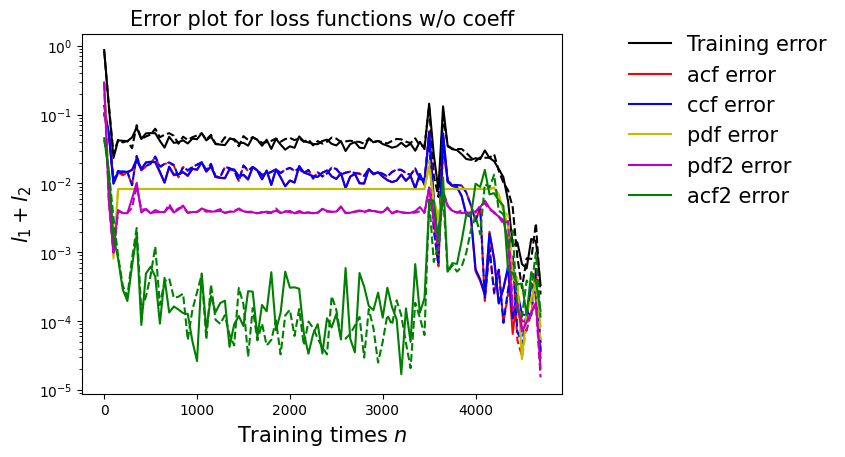

In [76]:
draw_errors(model)

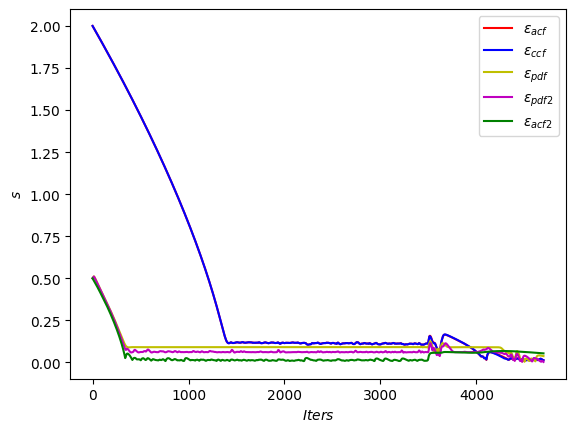

In [77]:
draw_adaptive_w(model)

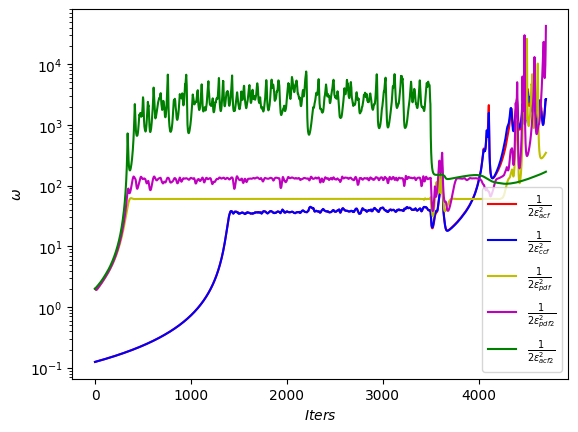

In [78]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [79]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [80]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [81]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [82]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [83]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [84]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [85]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

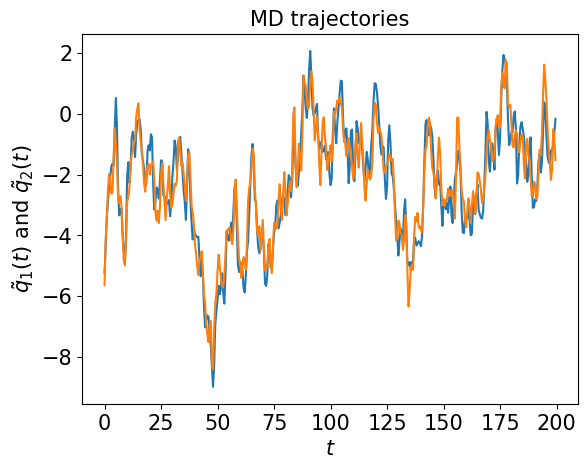

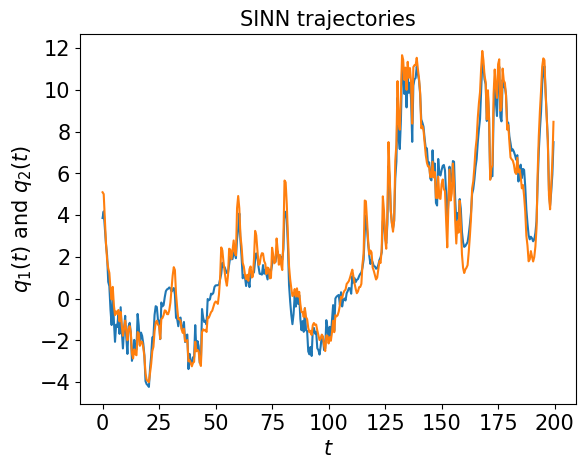

In [86]:
test1(model)

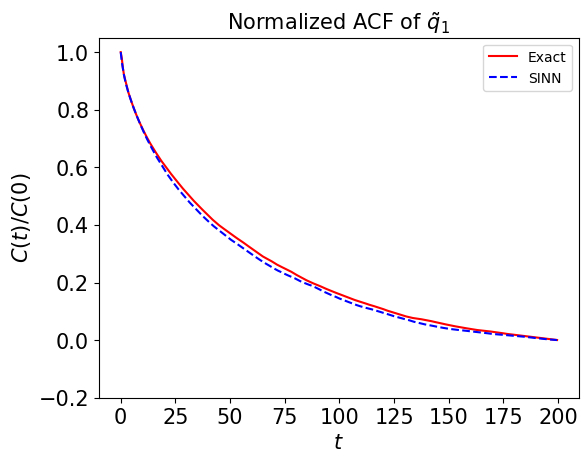

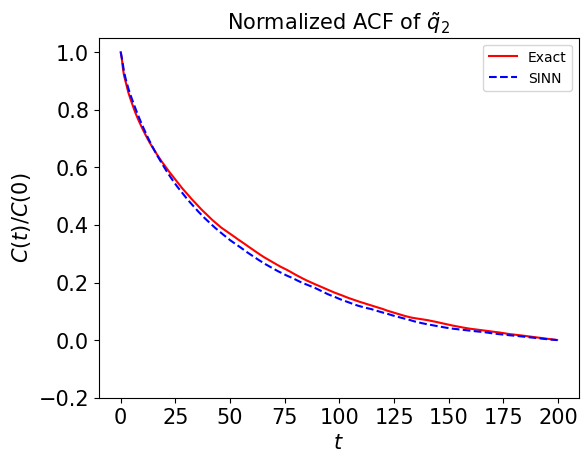

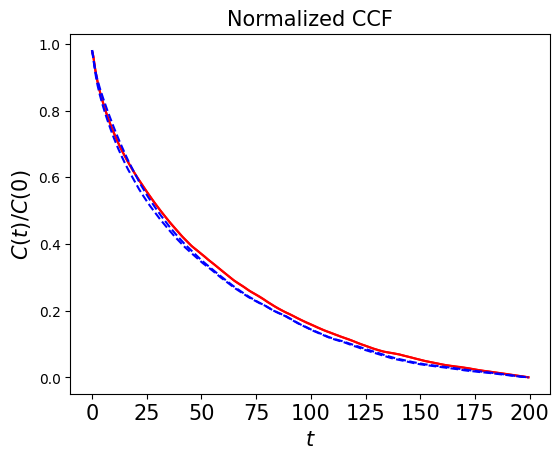

In [87]:
test2(model)

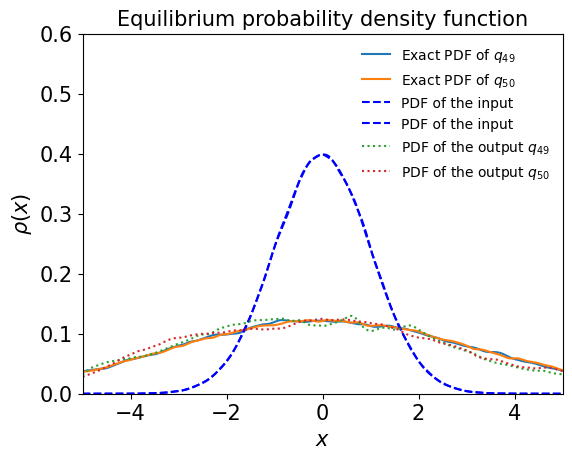

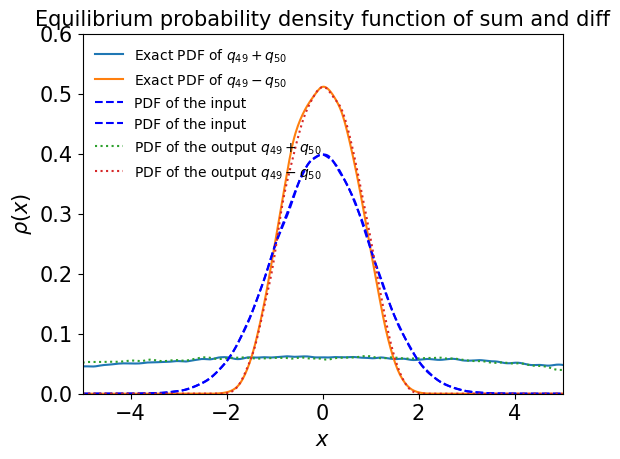

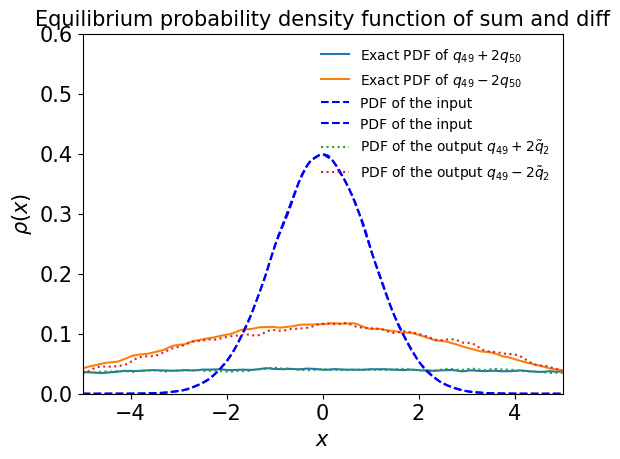

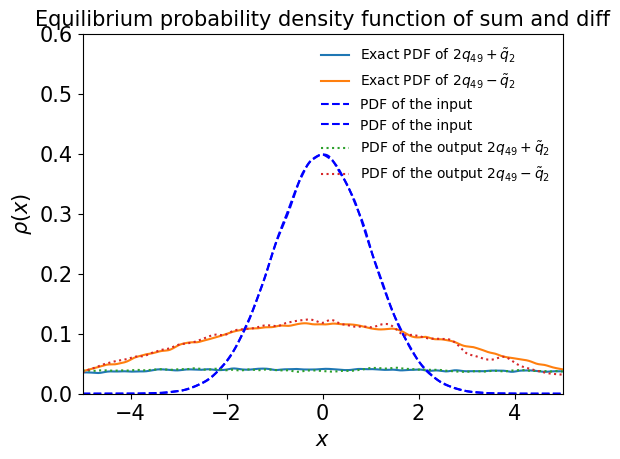

In [88]:
test3(model)

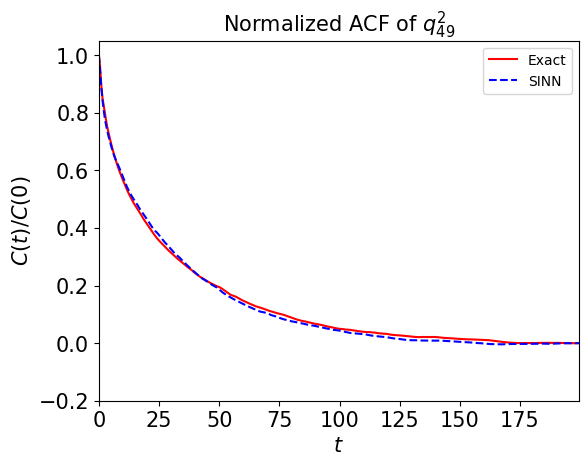

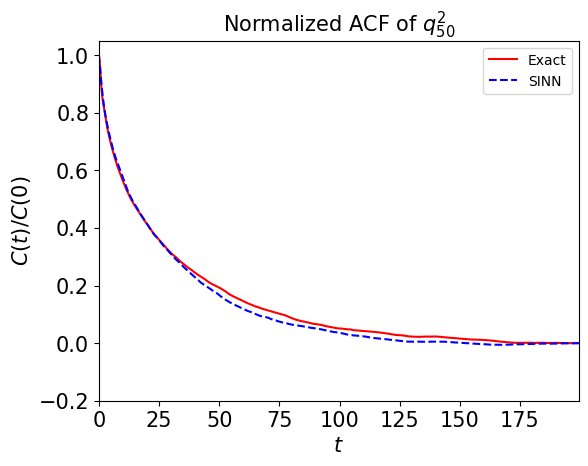

In [89]:
test4(model)

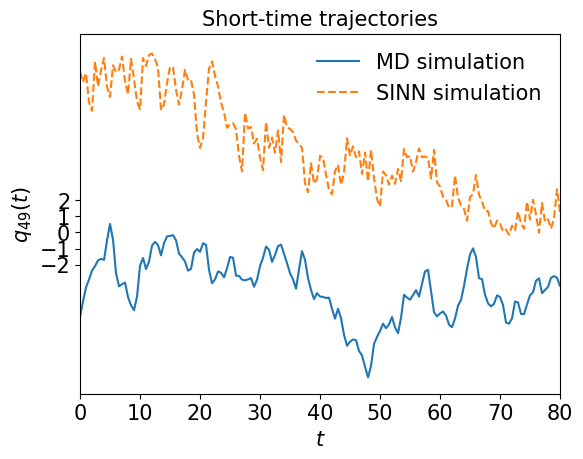

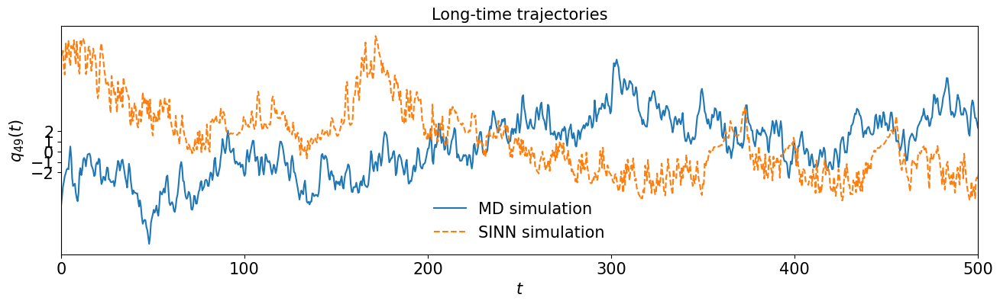

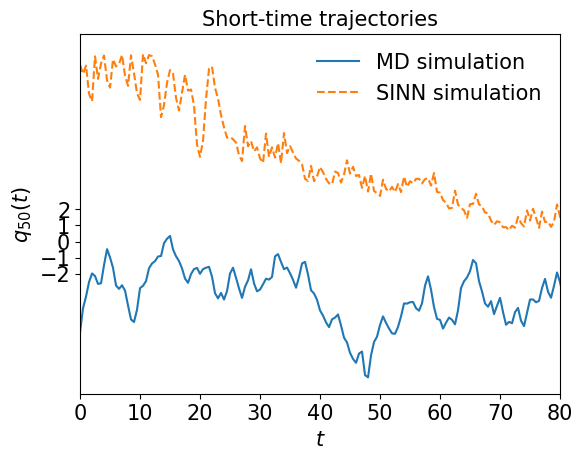

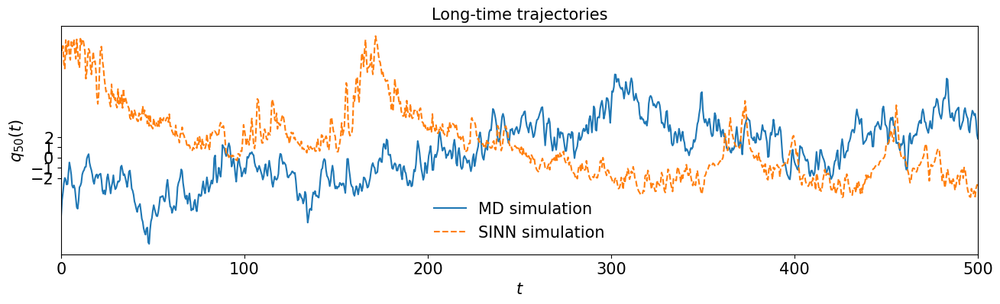

In [90]:
test5(model)

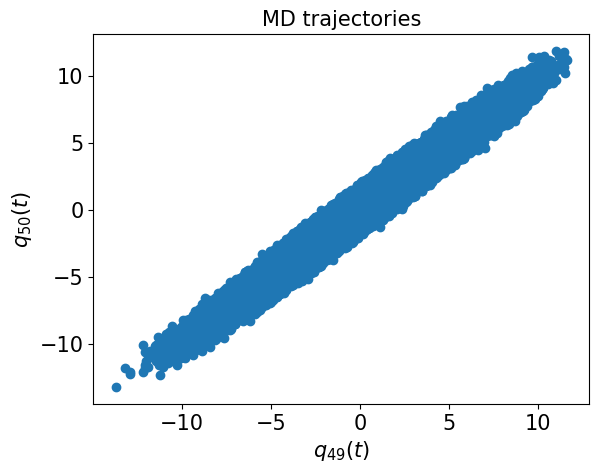

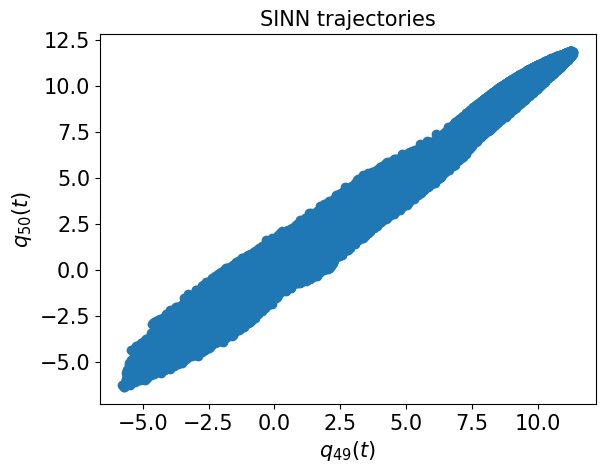

In [91]:
test6(model)

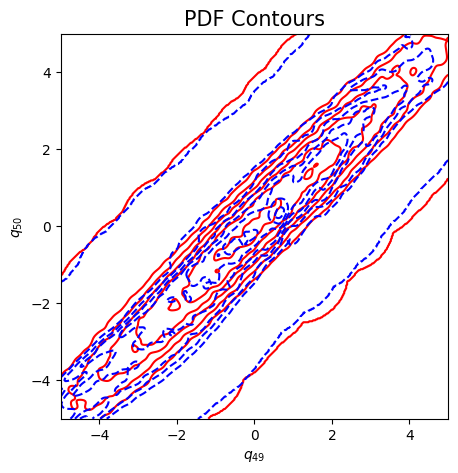

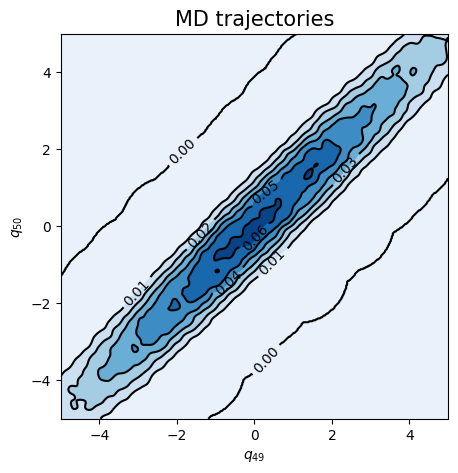

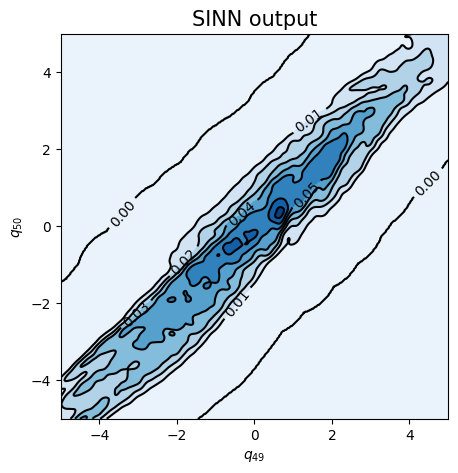

In [92]:
test7(model)

In [93]:
### Defining SINN model
net1 = SINN(2, 150, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8351, 0.8184, acf: 0.09743, ccf: 0.09684, pdf: 0.29321, pdf2: 0.28977, acf2: 0.04113
[50]-th step loss: 0.0625, 0.0879, acf: 0.00126, ccf: 0.00125, pdf: 0.03615, pdf2: 0.02629, acf2: 0.02289
[100]-th step loss: 0.0181, 0.0185, acf: 0.00332, ccf: 0.00281, pdf: 0.00604, pdf2: 0.00531, acf2: 0.00101
[150]-th step loss: 0.0416, 0.0501, acf: 0.02115, ccf: 0.02116, pdf: 0.00252, pdf2: 0.00221, acf2: 0.00305
[200]-th step loss: 0.0565, 0.0540, acf: 0.02501, ccf: 0.02502, pdf: 0.00045, pdf2: 0.00019, acf2: 0.00338
[250]-th step loss: 0.2911, 0.3077, acf: 0.03048, ccf: 0.25910, pdf: 0.00828, pdf2: 0.00469, acf2: 0.00516
[300]-th step loss: 0.3028, 0.2963, acf: 0.02914, ccf: 0.25272, pdf: 0.00828, pdf2: 0.00426, acf2: 0.00192
[350]-th step loss: 0.4664, 0.3769, acf: 0.00917, ccf: 0.35090, pdf: 0.00829, pdf2: 0.00718, acf2: 0.00138
[400]-th step loss: 0.3630, 0.3705, acf: 0.02273, ccf: 0.32019, pdf: 0.00829, pdf2: 0.01739, acf2: 0.00194
[450]-th step loss: 0.3465, 0.3440, acf:

[3850]-th step loss: 0.0272, 0.0247, acf: 0.00004, ccf: 0.00006, pdf: 0.00717, pdf2: 0.00972, acf2: 0.00767
[3900]-th step loss: 0.0200, 0.0204, acf: 0.00021, ccf: 0.00020, pdf: 0.00670, pdf2: 0.00703, acf2: 0.00625
[3950]-th step loss: 0.0222, 0.0193, acf: 0.00017, ccf: 0.00014, pdf: 0.00611, pdf2: 0.00582, acf2: 0.00708
[4000]-th step loss: 0.0214, 0.0186, acf: 0.00004, ccf: 0.00010, pdf: 0.00763, pdf2: 0.00428, acf2: 0.00660
[4050]-th step loss: 0.0160, 0.0157, acf: 0.00037, ccf: 0.00028, pdf: 0.00562, pdf2: 0.00531, acf2: 0.00410
[4100]-th step loss: 0.0157, 0.0168, acf: 0.00008, ccf: 0.00002, pdf: 0.00559, pdf2: 0.00527, acf2: 0.00587
[4150]-th step loss: 0.0635, 0.0321, acf: 0.00064, ccf: 0.00127, pdf: 0.01013, pdf2: 0.01148, acf2: 0.00859
[4200]-th step loss: 0.0210, 0.0208, acf: 0.00162, ccf: 0.00166, pdf: 0.00790, pdf2: 0.00528, acf2: 0.00431
[4250]-th step loss: 0.0249, 0.0263, acf: 0.00057, ccf: 0.00059, pdf: 0.00748, pdf2: 0.00371, acf2: 0.01395
[4300]-th step loss: 0.0254,

[7650]-th step loss: 0.0210, 0.0201, acf: 0.00016, ccf: 0.00016, pdf: 0.00435, pdf2: 0.00637, acf2: 0.00906
[7700]-th step loss: 0.0161, 0.0187, acf: 0.00008, ccf: 0.00009, pdf: 0.00497, pdf2: 0.00566, acf2: 0.00789
[7750]-th step loss: 0.0173, 0.0171, acf: 0.00001, ccf: 0.00001, pdf: 0.00464, pdf2: 0.00589, acf2: 0.00659
[7800]-th step loss: 0.0176, 0.0203, acf: 0.00007, ccf: 0.00007, pdf: 0.00481, pdf2: 0.00646, acf2: 0.00885
[7850]-th step loss: 0.0166, 0.0169, acf: 0.00003, ccf: 0.00003, pdf: 0.00441, pdf2: 0.00562, acf2: 0.00681
[7900]-th step loss: 0.0136, 0.0156, acf: 0.00005, ccf: 0.00004, pdf: 0.00457, pdf2: 0.00509, acf2: 0.00586
[7950]-th step loss: 0.0197, 0.0177, acf: 0.00003, ccf: 0.00004, pdf: 0.00448, pdf2: 0.00571, acf2: 0.00747
[8000]-th step loss: 0.0134, 0.0139, acf: 0.00018, ccf: 0.00017, pdf: 0.00487, pdf2: 0.00440, acf2: 0.00432
[8050]-th step loss: 0.0147, 0.0160, acf: 0.00003, ccf: 0.00003, pdf: 0.00434, pdf2: 0.00577, acf2: 0.00581
[8100]-th step loss: 0.0181,

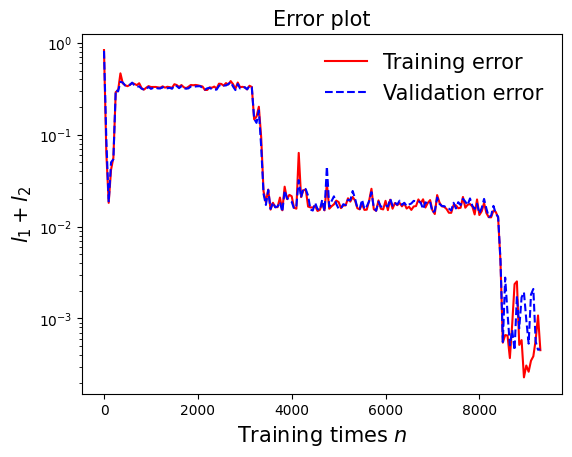

In [94]:
draw_loss(model1)

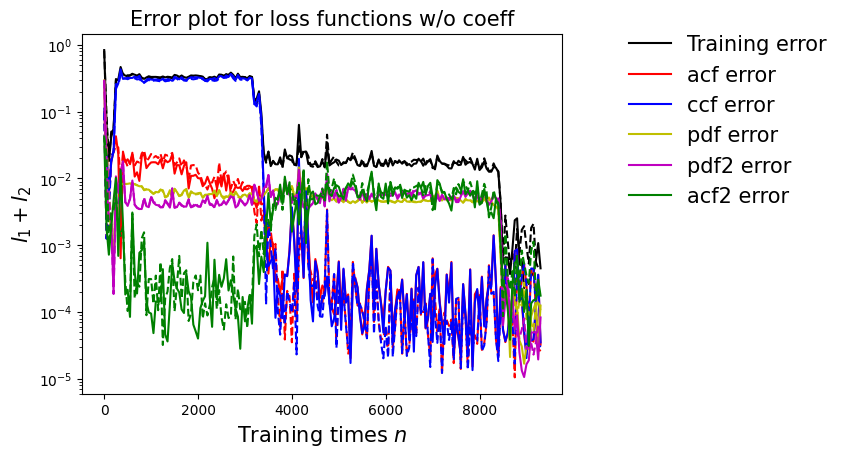

In [95]:
draw_errors(model1)

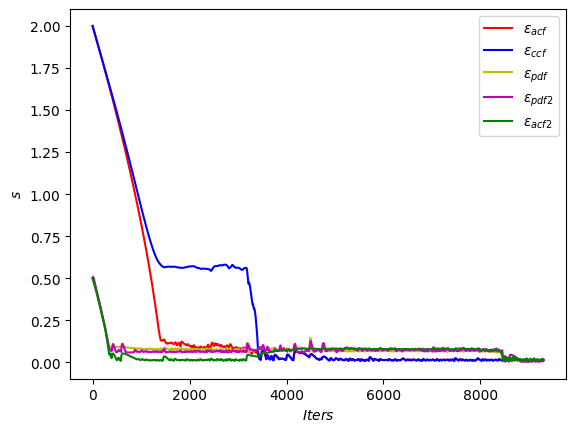

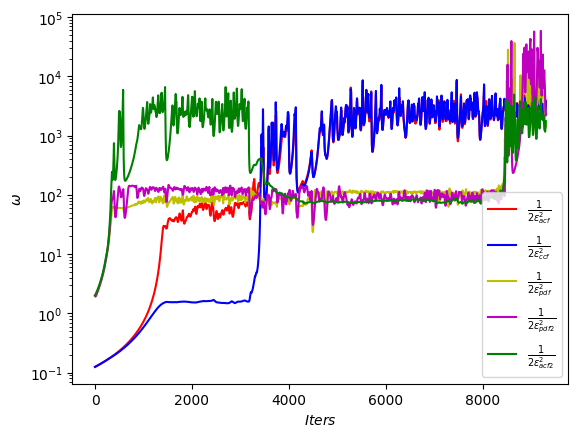

In [96]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

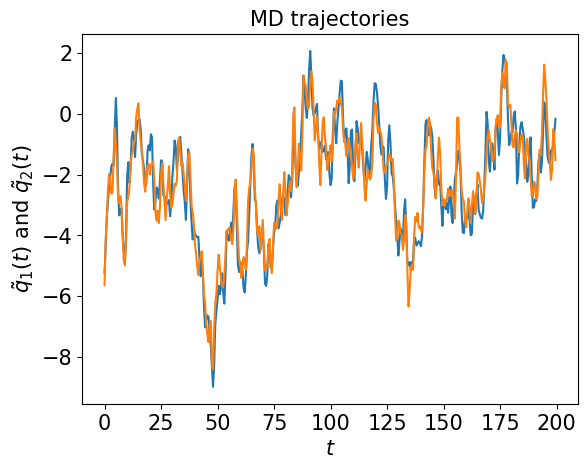

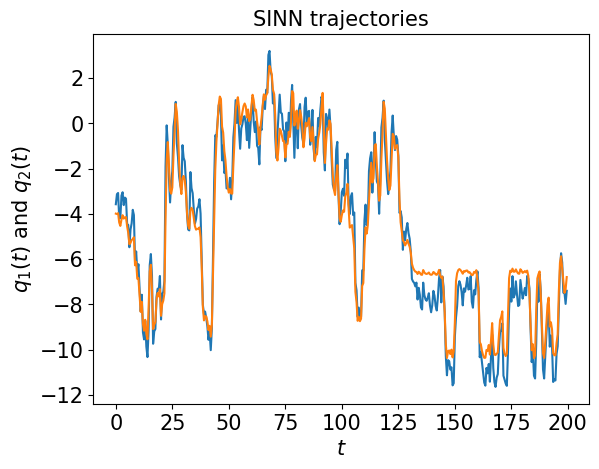

In [97]:
test1(model1)

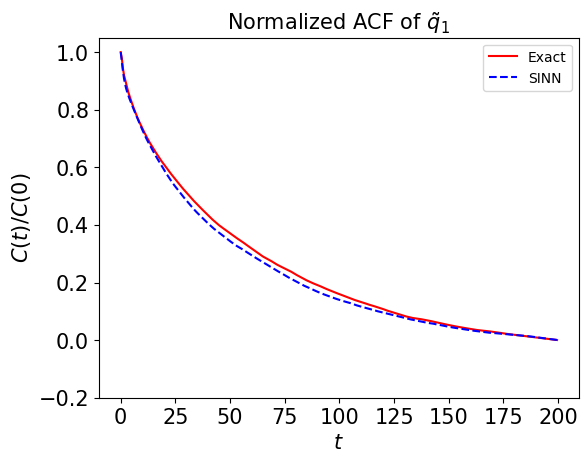

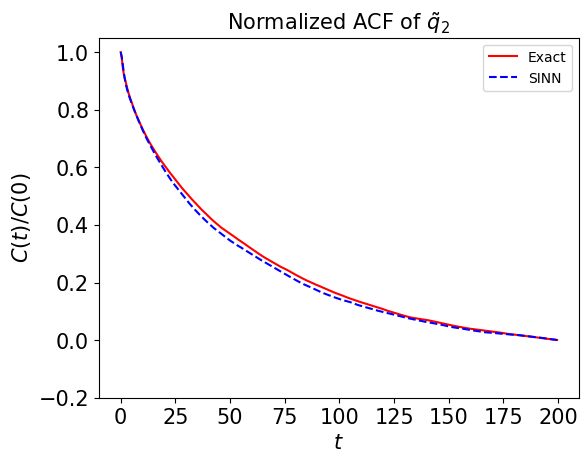

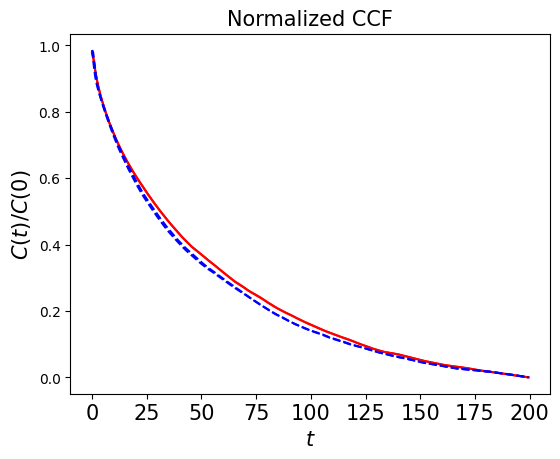

In [98]:
test2(model1)

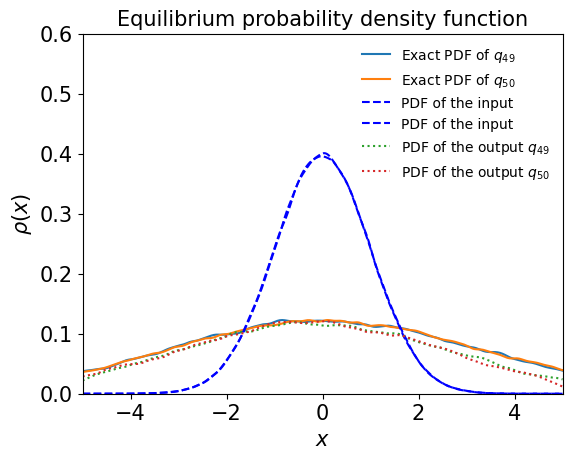

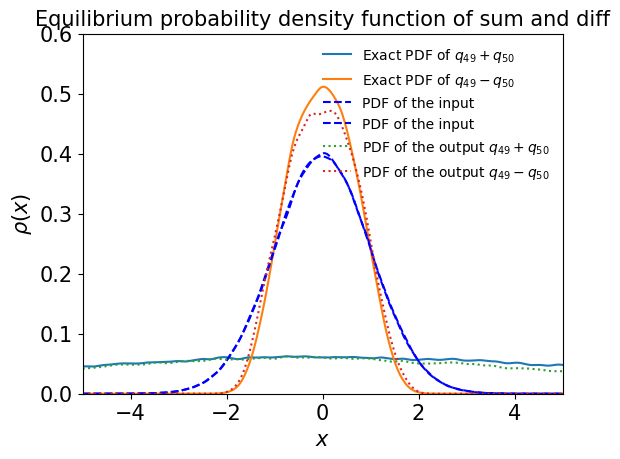

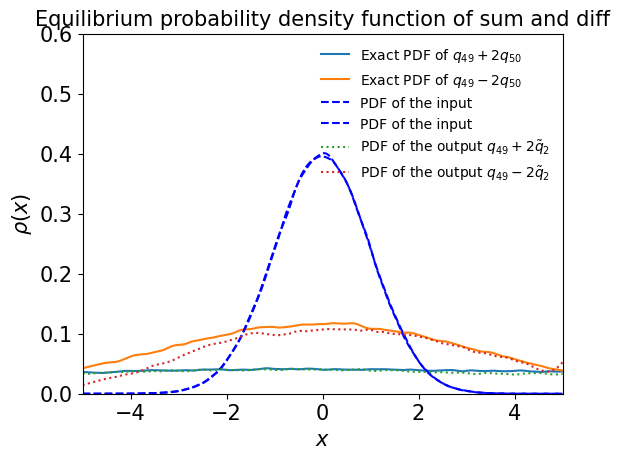

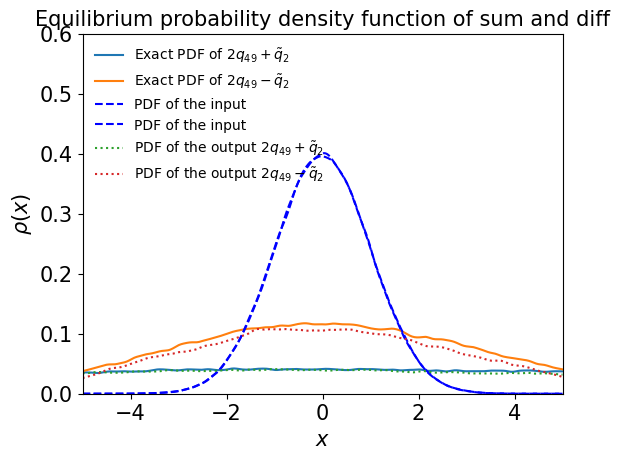

In [99]:
test3(model1)

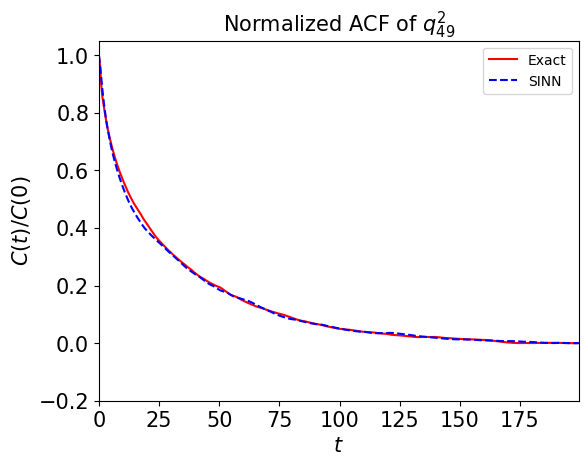

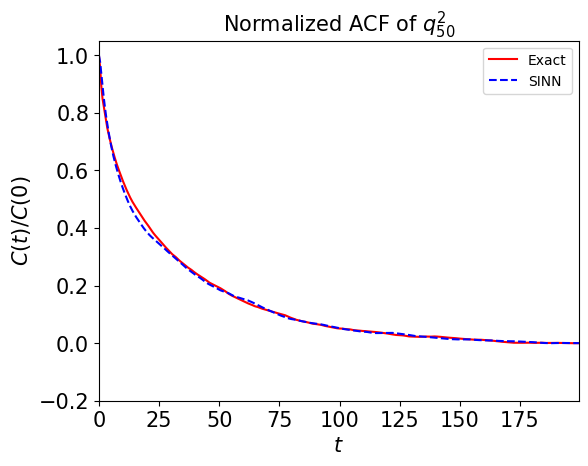

In [100]:
test4(model1)

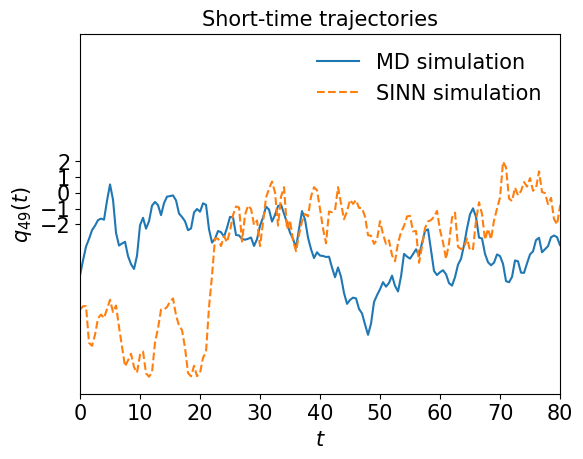

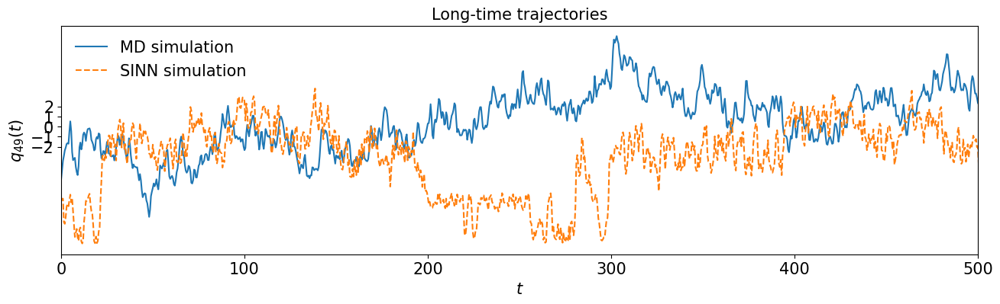

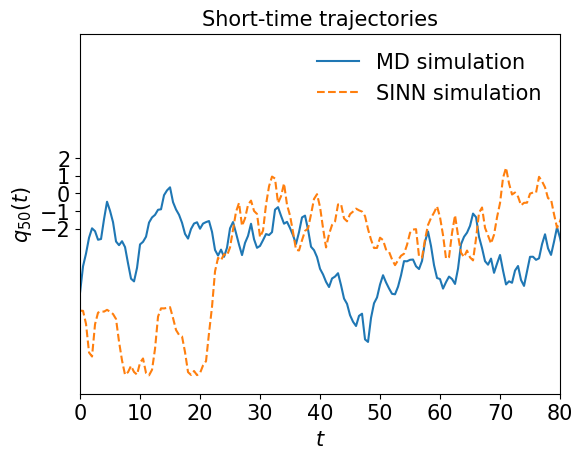

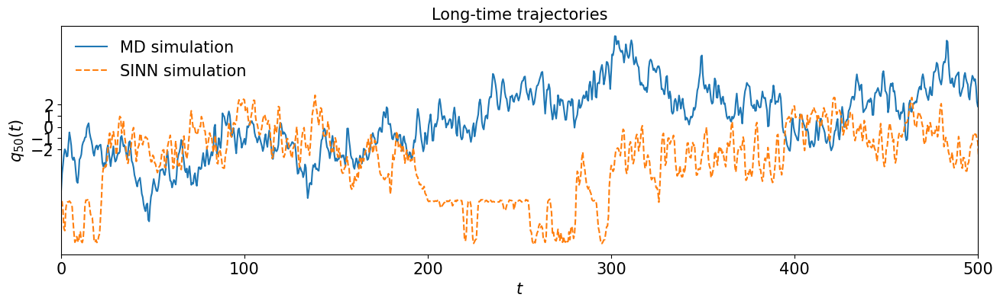

In [101]:
test5(model1)

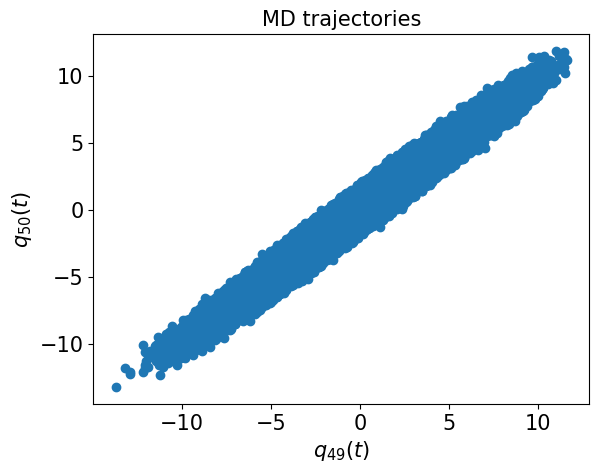

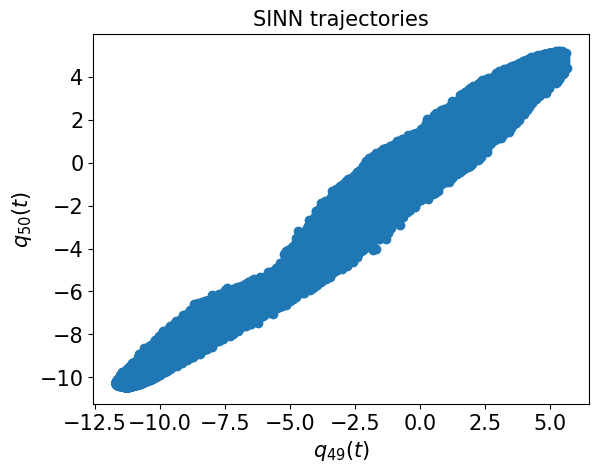

In [102]:
test6(model1)

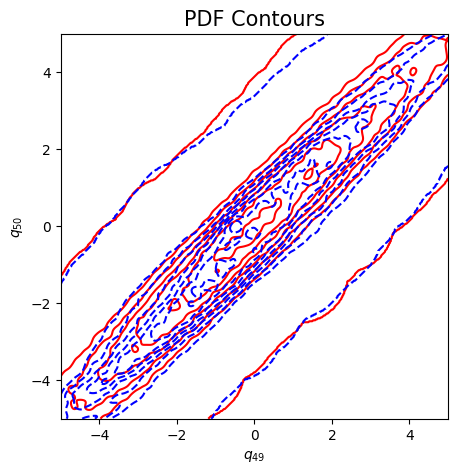

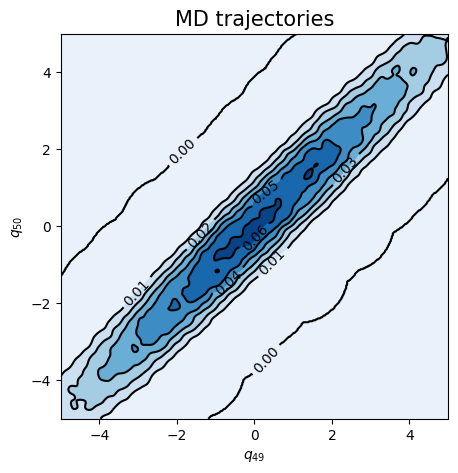

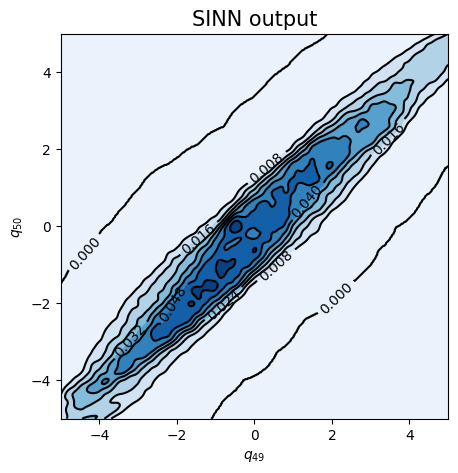

In [103]:
test7(model1)

In [104]:
### Defining SINN model
net2 = SINN(2, 150, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8449, 0.8206, acf: 0.09809, ccf: 0.09834, pdf: 0.29308, pdf2: 0.28953, acf2: 0.04161
[50]-th step loss: 0.0253, 0.0372, acf: 0.00799, ccf: 0.00809, pdf: 0.00886, pdf2: 0.00803, acf2: 0.00418
[100]-th step loss: 0.0936, 0.0614, acf: 0.01998, ccf: 0.02310, pdf: 0.00829, pdf2: 0.00815, acf2: 0.00183
[150]-th step loss: 0.0355, 0.0409, acf: 0.01415, ccf: 0.01423, pdf: 0.00829, pdf2: 0.00391, acf2: 0.00032
[200]-th step loss: 0.0351, 0.0396, acf: 0.01364, ccf: 0.01380, pdf: 0.00828, pdf2: 0.00364, acf2: 0.00023
[250]-th step loss: 0.0403, 0.0415, acf: 0.01467, ccf: 0.01477, pdf: 0.00826, pdf2: 0.00362, acf2: 0.00020
[300]-th step loss: 0.0451, 0.0507, acf: 0.01912, ccf: 0.01912, pdf: 0.00826, pdf2: 0.00382, acf2: 0.00033
[350]-th step loss: 0.0388, 0.1311, acf: 0.05010, ccf: 0.05023, pdf: 0.00830, pdf2: 0.01232, acf2: 0.01015
[400]-th step loss: 0.0384, 0.0462, acf: 0.01698, ccf: 0.01692, pdf: 0.00829, pdf2: 0.00369, acf2: 0.00032
[450]-th step loss: 0.0495, 0.0469, acf:

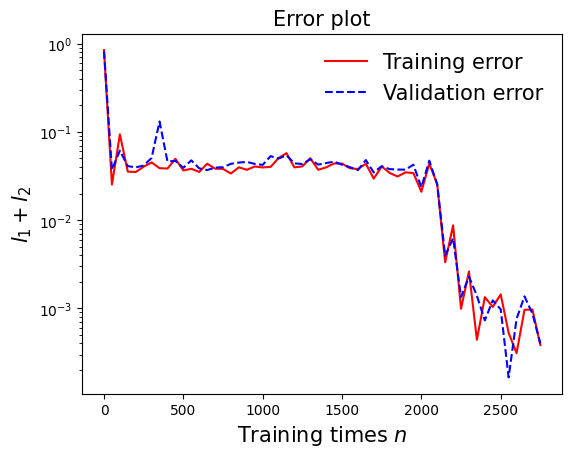

In [105]:
draw_loss(model2)

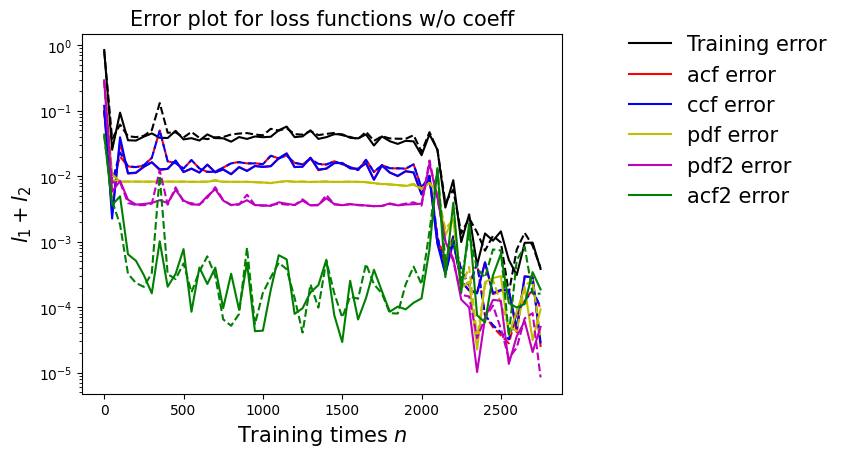

In [106]:
draw_errors(model2)

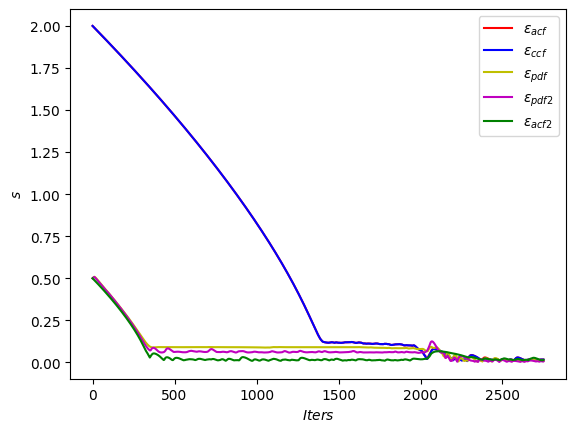

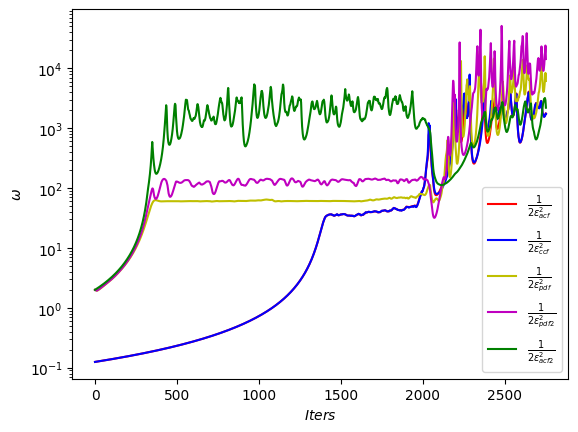

In [107]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

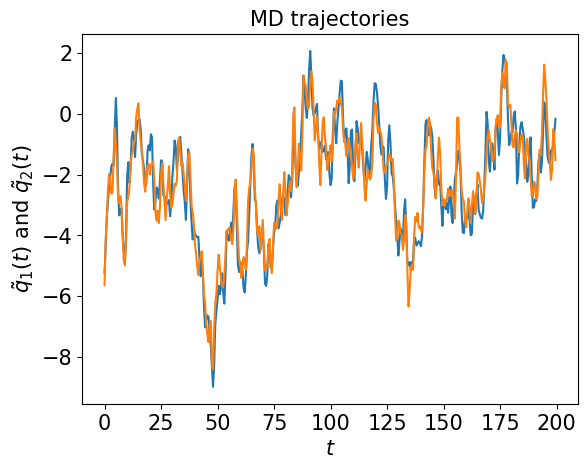

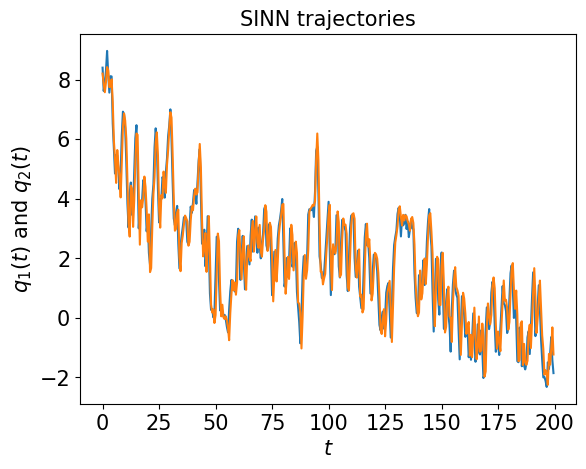

In [108]:
test1(model2)

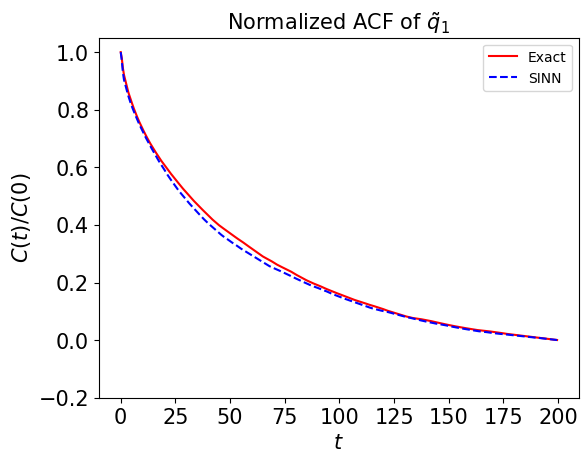

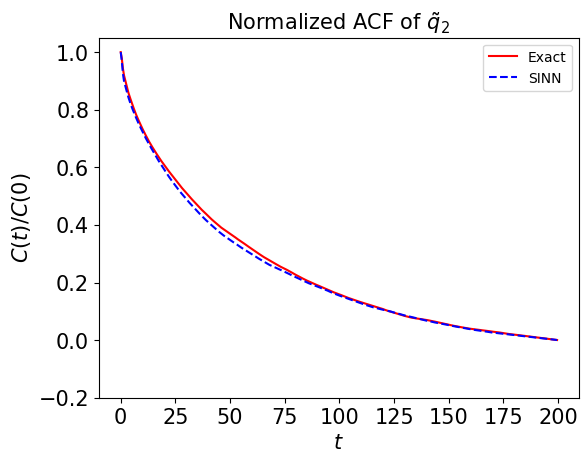

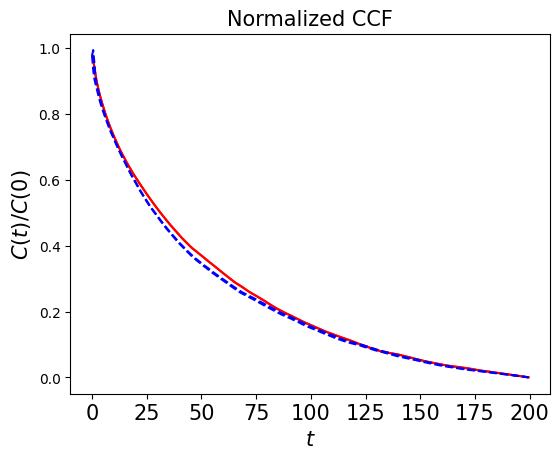

In [109]:
test2(model2)

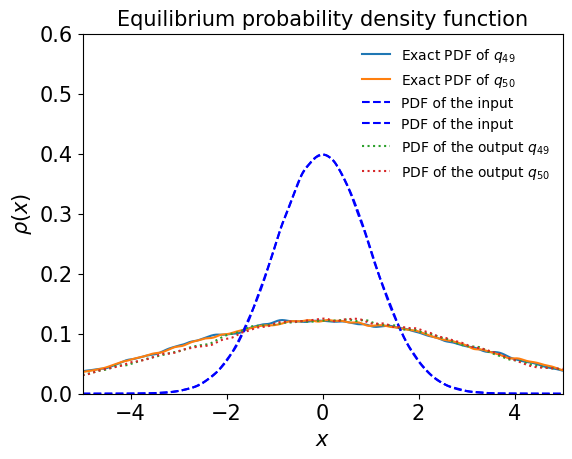

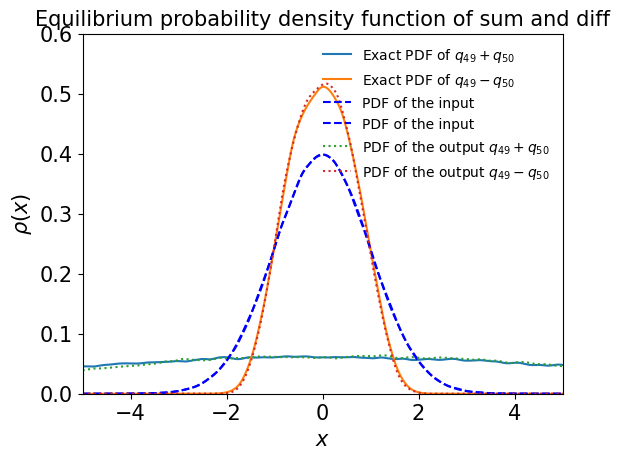

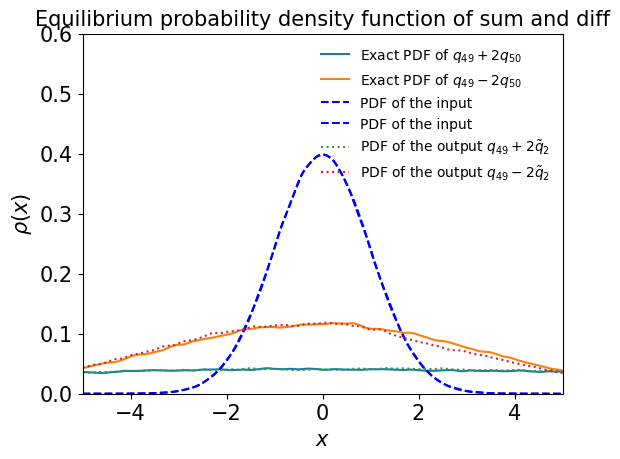

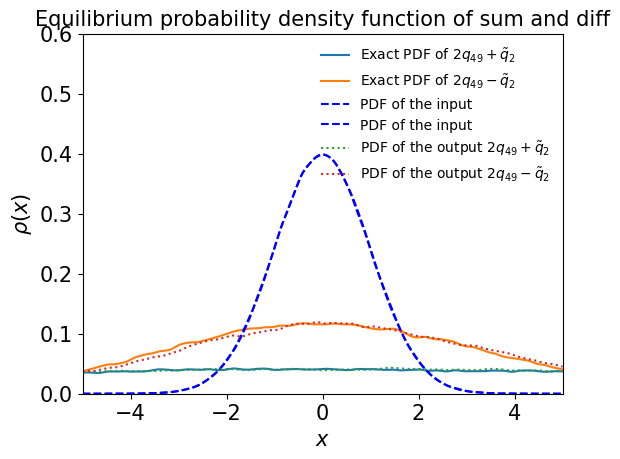

In [110]:
test3(model2)

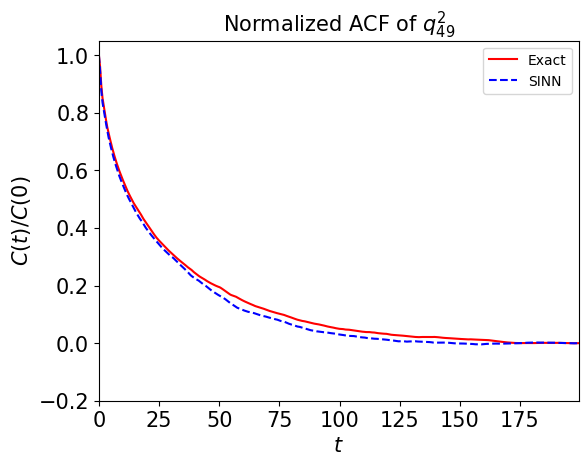

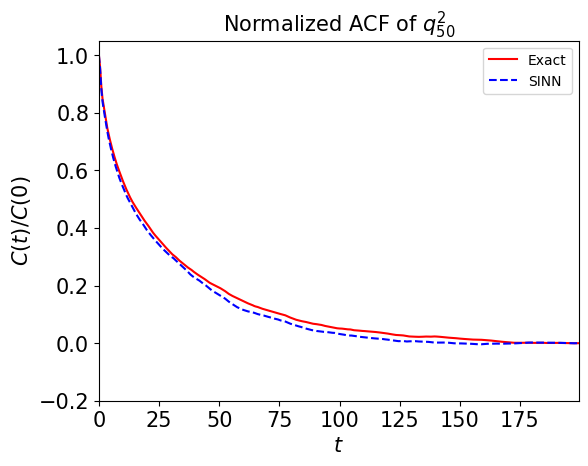

In [111]:
test4(model2)

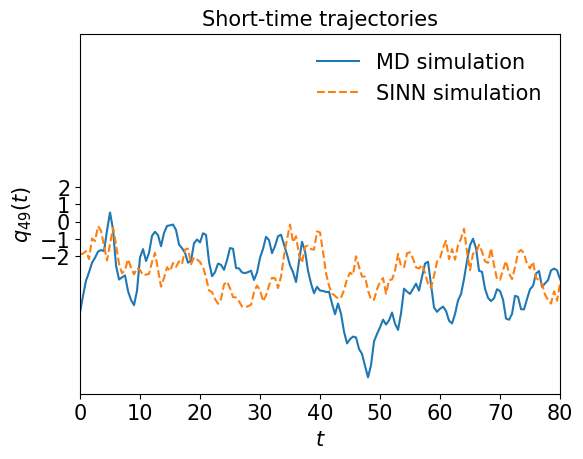

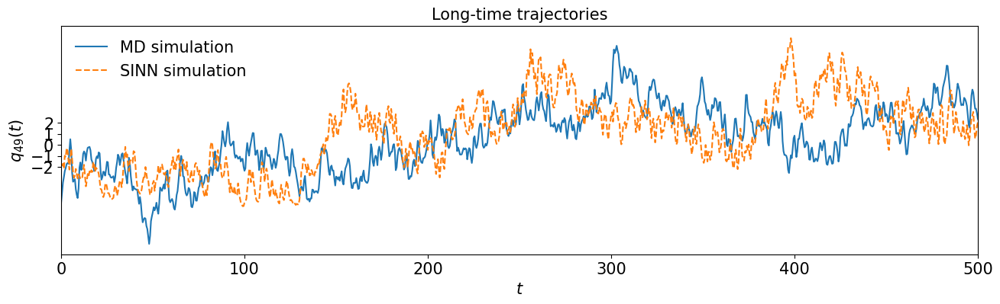

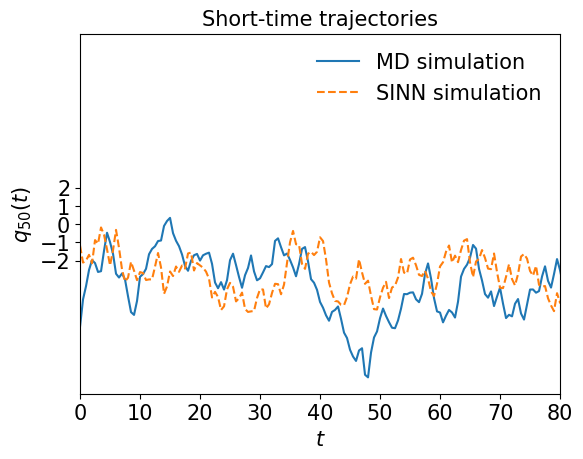

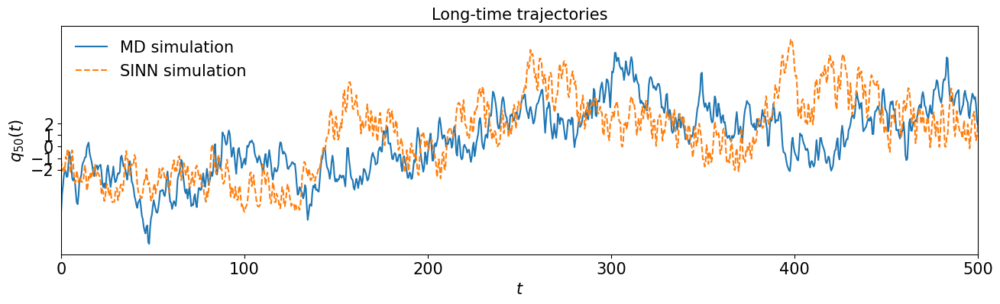

In [112]:
test5(model2)

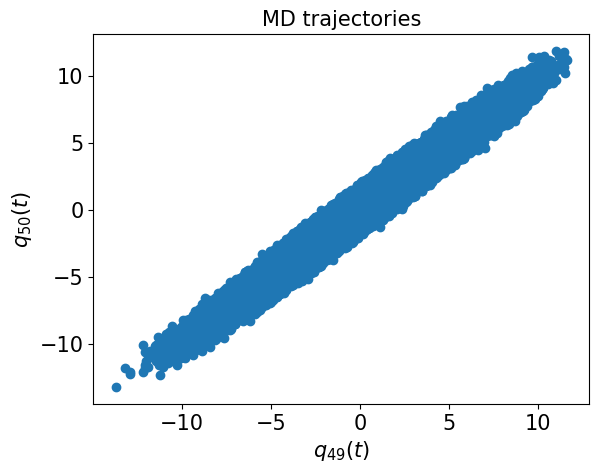

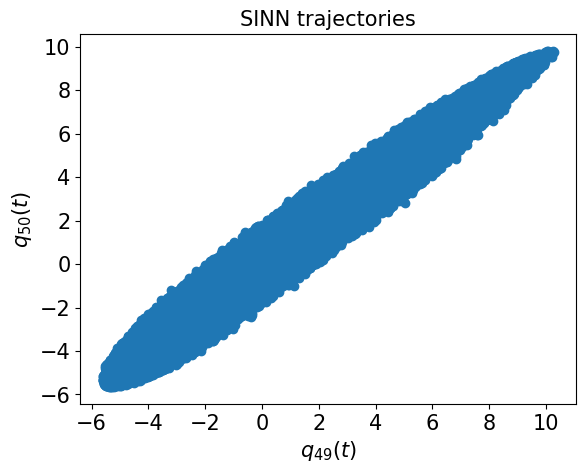

In [113]:
test6(model2)

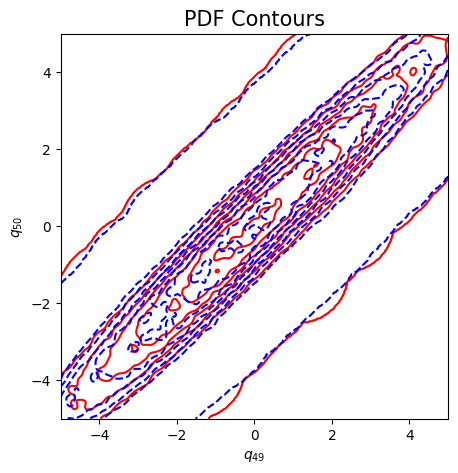

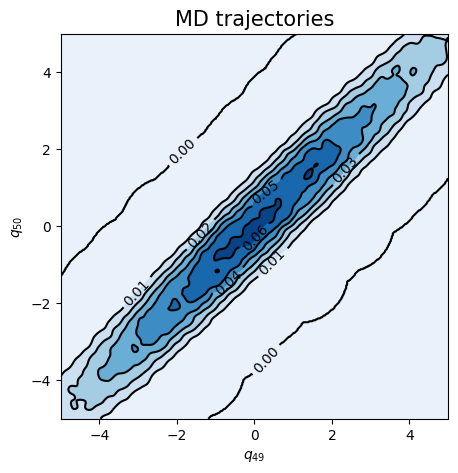

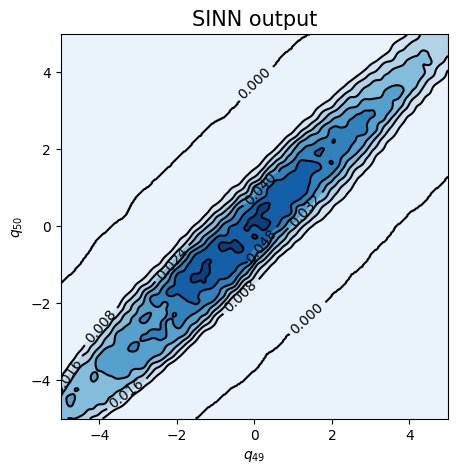

In [114]:
test7(model2)

In [115]:
### Defining SINN model
net3 = SINN(2, 150, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.8303, 0.8205, acf: 0.09697, ccf: 0.09970, pdf: 0.29309, pdf2: 0.28973, acf2: 0.04098
[50]-th step loss: 0.0509, 0.0667, acf: 0.02992, ccf: 0.03030, pdf: 0.00382, pdf2: 0.00165, acf2: 0.00099
[100]-th step loss: 0.1318, 0.1273, acf: 0.05509, ccf: 0.05517, pdf: 0.00318, pdf2: 0.00142, acf2: 0.01244
[150]-th step loss: 0.0260, 0.0343, acf: 0.01623, ccf: 0.01626, pdf: 0.00053, pdf2: 0.00027, acf2: 0.00105
[200]-th step loss: 0.0277, 0.0203, acf: 0.00988, ccf: 0.00987, pdf: 0.00028, pdf2: 0.00013, acf2: 0.00010
[250]-th step loss: 0.0126, 0.0200, acf: 0.00969, ccf: 0.00969, pdf: 0.00020, pdf2: 0.00016, acf2: 0.00024
[300]-th step loss: 0.0733, 0.0934, acf: 0.04204, ccf: 0.04201, pdf: 0.00251, pdf2: 0.00080, acf2: 0.00603
[350]-th step loss: 0.1520, 0.1447, acf: 0.06709, ccf: 0.06698, pdf: 0.00052, pdf2: 0.00042, acf2: 0.00972
[400]-th step loss: 0.0201, 0.0205, acf: 0.00100, ccf: 0.00099, pdf: 0.00058, pdf2: 0.00039, acf2: 0.01753
[450]-th step loss: 0.2588, 0.2568, acf:

[3850]-th step loss: 0.0287, 0.0316, acf: 0.00036, ccf: 0.00036, pdf: 0.00829, pdf2: 0.00387, acf2: 0.01869
[3900]-th step loss: 0.0258, 0.0295, acf: 0.00016, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00446, acf2: 0.01642
[3950]-th step loss: 0.0278, 0.0295, acf: 0.00015, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00376, acf2: 0.01712
[4000]-th step loss: 0.0288, 0.0366, acf: 0.00067, ccf: 0.00067, pdf: 0.00829, pdf2: 0.00574, acf2: 0.02122
[4050]-th step loss: 0.0338, 0.0458, acf: 0.00055, ccf: 0.00054, pdf: 0.00828, pdf2: 0.01633, acf2: 0.02014
[4100]-th step loss: 0.0230, 0.0302, acf: 0.00020, ccf: 0.00020, pdf: 0.00829, pdf2: 0.00398, acf2: 0.01756
[4150]-th step loss: 0.0362, 0.0325, acf: 0.00017, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00898, acf2: 0.01492
[4200]-th step loss: 0.0281, 0.0307, acf: 0.00023, ccf: 0.00023, pdf: 0.00829, pdf2: 0.00403, acf2: 0.01796
[4250]-th step loss: 0.0380, 0.0370, acf: 0.00103, ccf: 0.00103, pdf: 0.00829, pdf2: 0.00436, acf2: 0.02225
[4300]-th step loss: 0.0237,

[7650]-th step loss: 0.0284, 0.0266, acf: 0.00012, ccf: 0.00012, pdf: 0.00829, pdf2: 0.00411, acf2: 0.01394
[7700]-th step loss: 0.0234, 0.0276, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01551
[7750]-th step loss: 0.0302, 0.0290, acf: 0.00013, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00374, acf2: 0.01671
[7800]-th step loss: 0.0283, 0.0293, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00477, acf2: 0.01607
[7850]-th step loss: 0.0248, 0.0285, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00368, acf2: 0.01640
[7900]-th step loss: 0.0250, 0.0292, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00463, acf2: 0.01610
[7950]-th step loss: 0.0256, 0.0291, acf: 0.00014, ccf: 0.00014, pdf: 0.00829, pdf2: 0.00372, acf2: 0.01684
[8000]-th step loss: 0.0251, 0.0315, acf: 0.00035, ccf: 0.00036, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01866
[8050]-th step loss: 0.0289, 0.0294, acf: 0.00010, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00453, acf2: 0.01636
[8100]-th step loss: 0.0289,

[11450]-th step loss: 0.0317, 0.0262, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01423
[11500]-th step loss: 0.0302, 0.0311, acf: 0.00028, ccf: 0.00028, pdf: 0.00828, pdf2: 0.00499, acf2: 0.01727
[11550]-th step loss: 0.0300, 0.0300, acf: 0.00017, ccf: 0.00017, pdf: 0.00827, pdf2: 0.00411, acf2: 0.01726
[11600]-th step loss: 0.0238, 0.0303, acf: 0.00025, ccf: 0.00026, pdf: 0.00826, pdf2: 0.00414, acf2: 0.01742
[11650]-th step loss: 0.0239, 0.0258, acf: 0.00009, ccf: 0.00008, pdf: 0.00828, pdf2: 0.00376, acf2: 0.01356
[11700]-th step loss: 0.0245, 0.0252, acf: 0.00007, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00389, acf2: 0.01294
[11750]-th step loss: 0.0289, 0.0297, acf: 0.00019, ccf: 0.00019, pdf: 0.00828, pdf2: 0.00389, acf2: 0.01715
[11800]-th step loss: 0.0262, 0.0293, acf: 0.00018, ccf: 0.00019, pdf: 0.00825, pdf2: 0.00398, acf2: 0.01668
[11850]-th step loss: 0.0258, 0.0299, acf: 0.00019, ccf: 0.00020, pdf: 0.00827, pdf2: 0.00370, acf2: 0.01757
[11900]-th step los

[15250]-th step loss: 0.0214, 0.0269, acf: 0.00005, ccf: 0.00005, pdf: 0.00817, pdf2: 0.00410, acf2: 0.01457
[15300]-th step loss: 0.0350, 0.0394, acf: 0.00270, ccf: 0.00267, pdf: 0.00829, pdf2: 0.00499, acf2: 0.02076
[15350]-th step loss: 0.0309, 0.0286, acf: 0.00169, ccf: 0.00166, pdf: 0.00829, pdf2: 0.00375, acf2: 0.01320
[15400]-th step loss: 0.0286, 0.0298, acf: 0.00130, ccf: 0.00129, pdf: 0.00829, pdf2: 0.00501, acf2: 0.01389
[15450]-th step loss: 0.0276, 0.0293, acf: 0.00081, ccf: 0.00081, pdf: 0.00829, pdf2: 0.00390, acf2: 0.01549
[15500]-th step loss: 0.0257, 0.0280, acf: 0.00064, ccf: 0.00066, pdf: 0.00828, pdf2: 0.00487, acf2: 0.01353
[15550]-th step loss: 0.0292, 0.0314, acf: 0.00019, ccf: 0.00025, pdf: 0.00826, pdf2: 0.00480, acf2: 0.01792
[15600]-th step loss: 0.0336, 0.0336, acf: 0.00054, ccf: 0.00057, pdf: 0.00827, pdf2: 0.00395, acf2: 0.02023
[15650]-th step loss: 0.0273, 0.0290, acf: 0.00039, ccf: 0.00042, pdf: 0.00823, pdf2: 0.00412, acf2: 0.01585
[15700]-th step los

[19050]-th step loss: 0.0299, 0.0344, acf: 0.00038, ccf: 0.00038, pdf: 0.00829, pdf2: 0.00609, acf2: 0.01928
[19100]-th step loss: 0.0290, 0.0325, acf: 0.00025, ccf: 0.00026, pdf: 0.00829, pdf2: 0.00439, acf2: 0.01932
[19150]-th step loss: 0.0275, 0.0269, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01473
[19200]-th step loss: 0.0322, 0.0310, acf: 0.00024, ccf: 0.00024, pdf: 0.00829, pdf2: 0.00404, acf2: 0.01814
[19250]-th step loss: 0.0258, 0.0283, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00371, acf2: 0.01616
[19300]-th step loss: 0.0305, 0.0283, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00387, acf2: 0.01603
[19350]-th step loss: 0.0310, 0.0314, acf: 0.00011, ccf: 0.00011, pdf: 0.00768, pdf2: 0.00924, acf2: 0.01423
[19400]-th step loss: 0.0235, 0.0257, acf: 0.00026, ccf: 0.00026, pdf: 0.00613, pdf2: 0.01001, acf2: 0.00909
[19450]-th step loss: 0.0334, 0.0352, acf: 0.00015, ccf: 0.00016, pdf: 0.00917, pdf2: 0.00916, acf2: 0.01656
[19500]-th step los

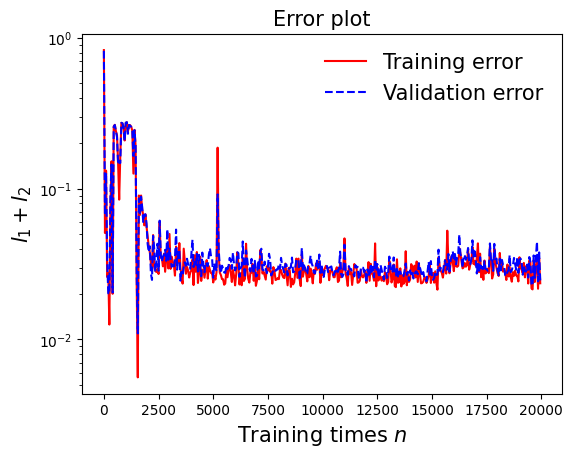

In [116]:
draw_loss(model3)

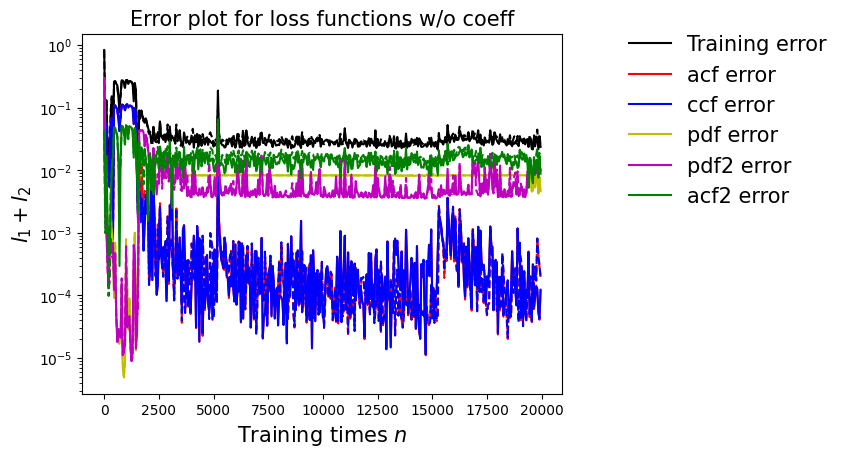

In [117]:
draw_errors(model3)

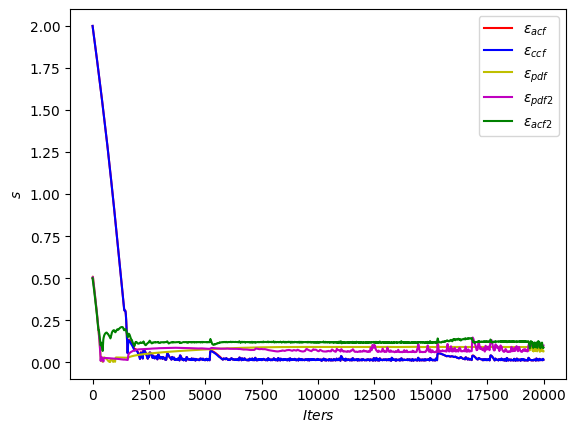

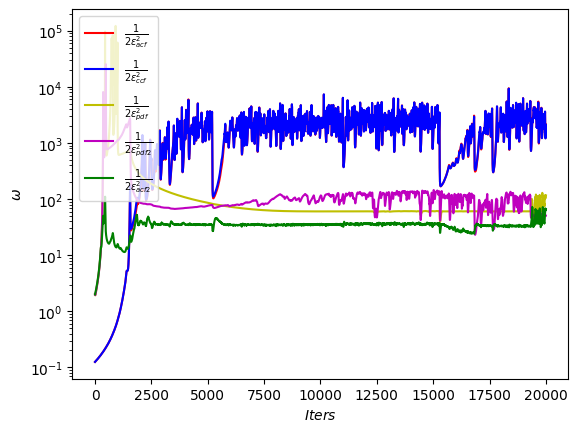

In [118]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

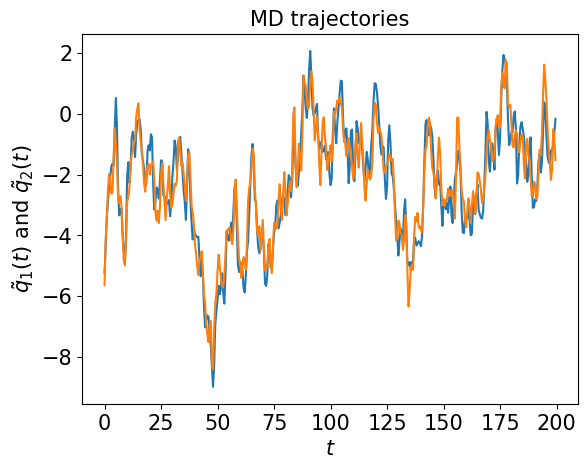

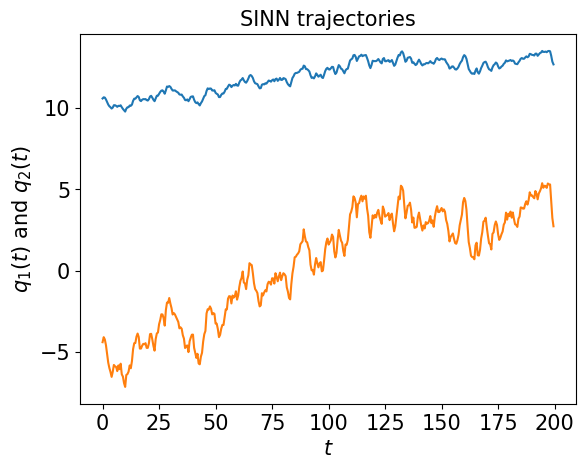

In [119]:
test1(model3)

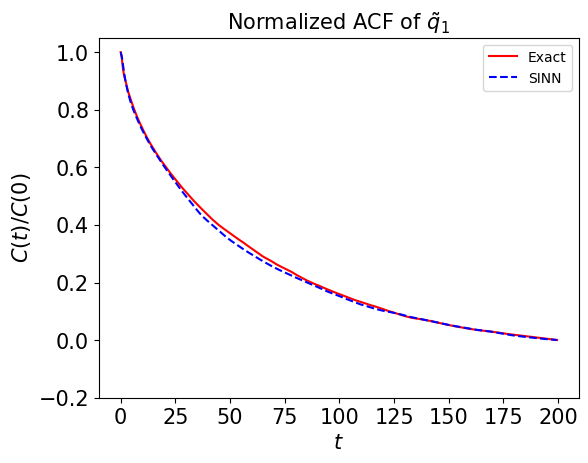

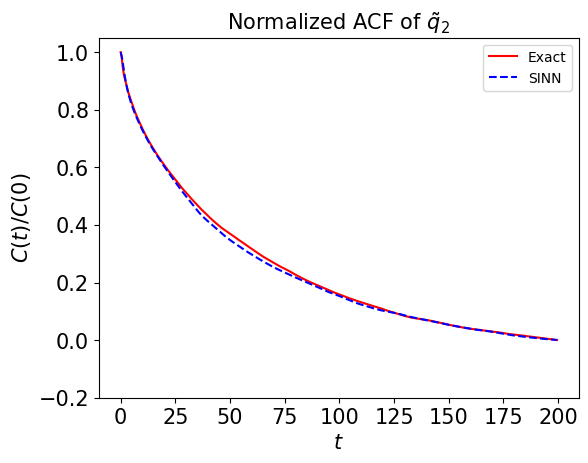

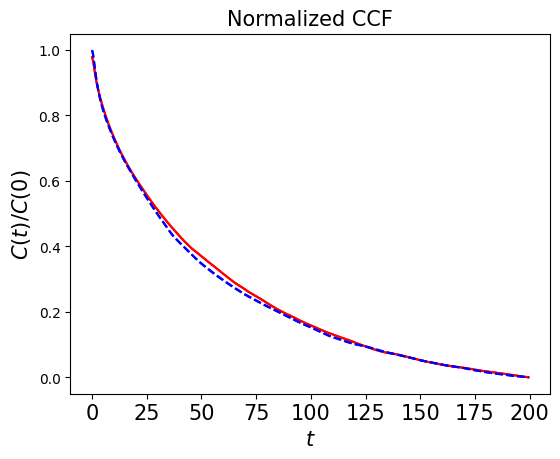

In [120]:
test2(model3)

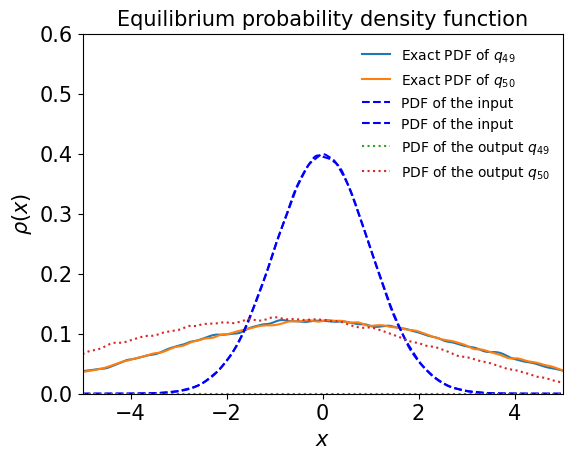

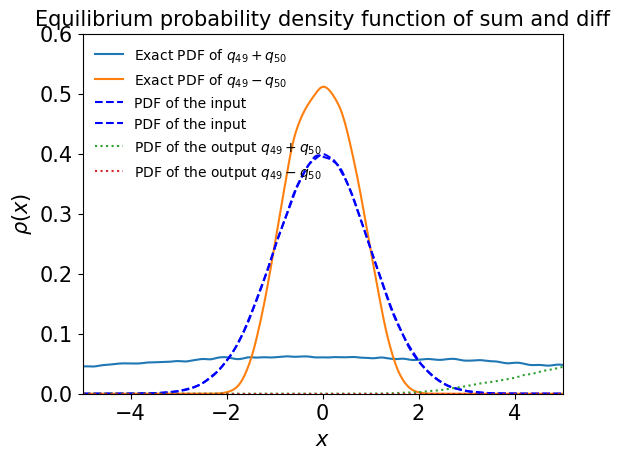

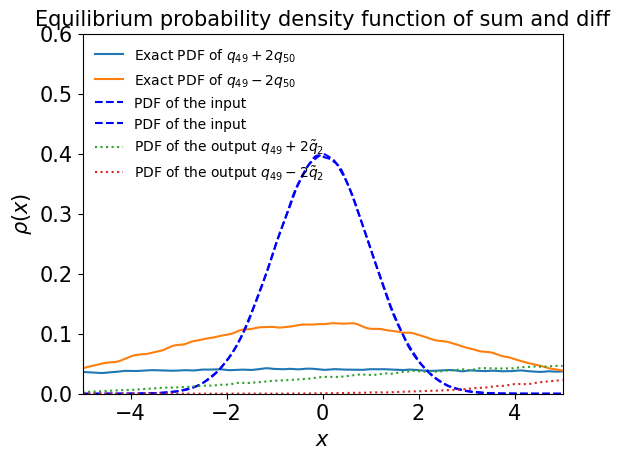

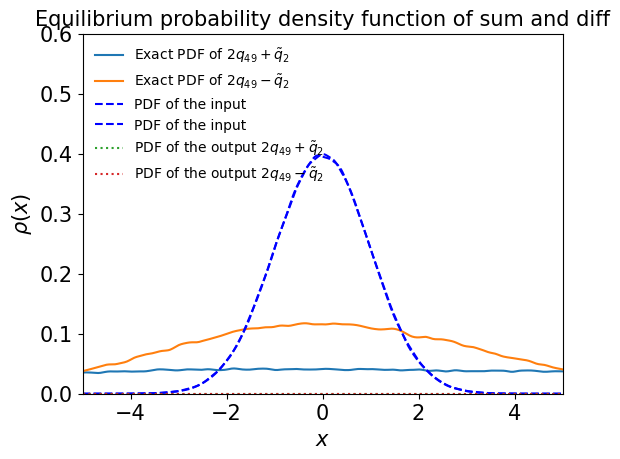

In [121]:
test3(model3)

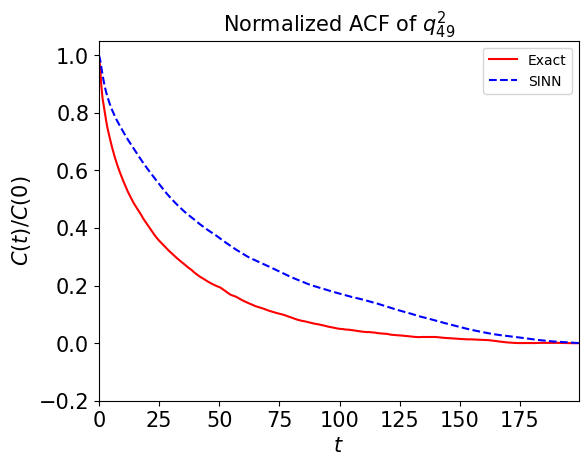

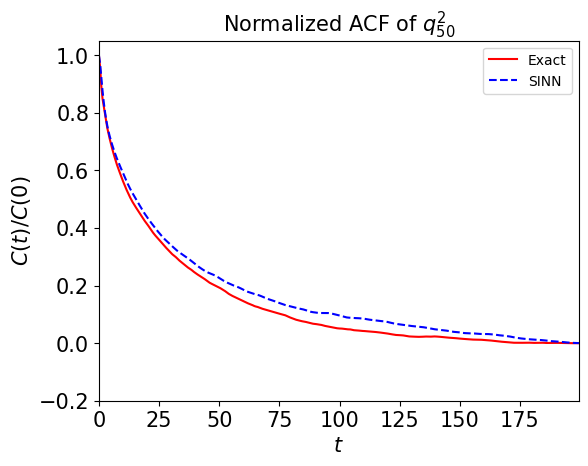

In [122]:
test4(model3)

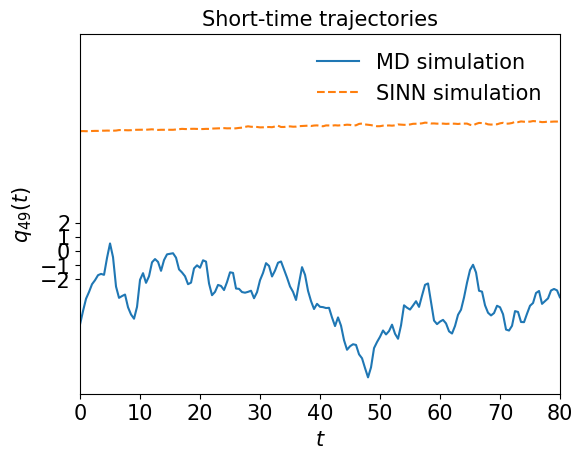

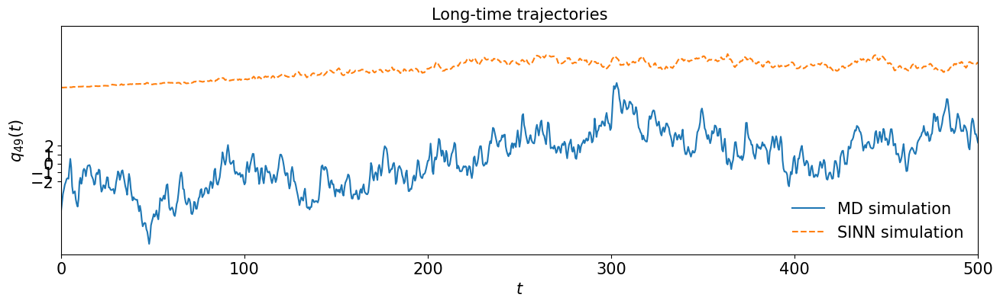

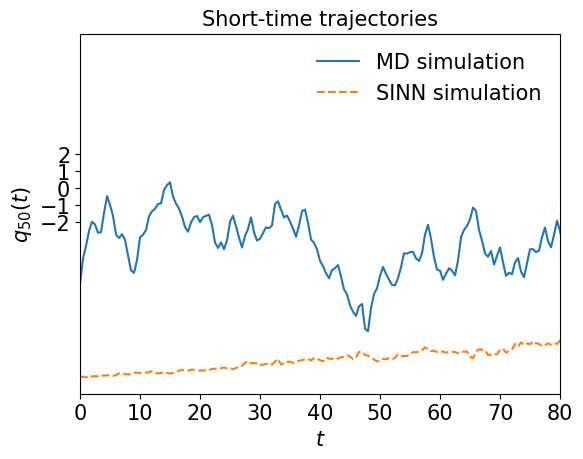

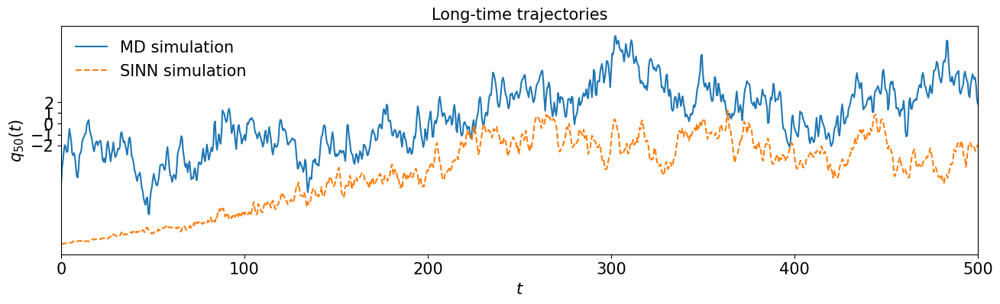

In [123]:
test5(model3)

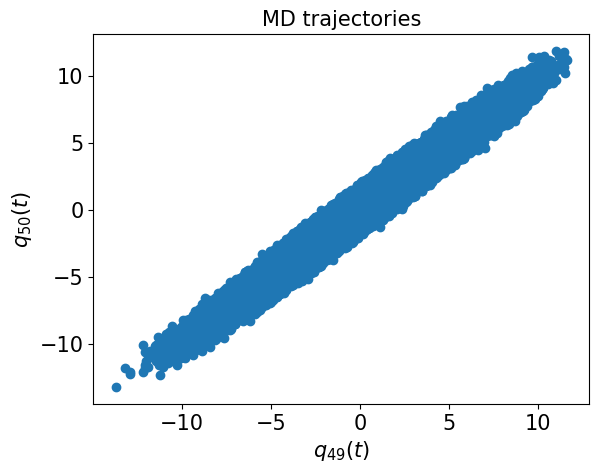

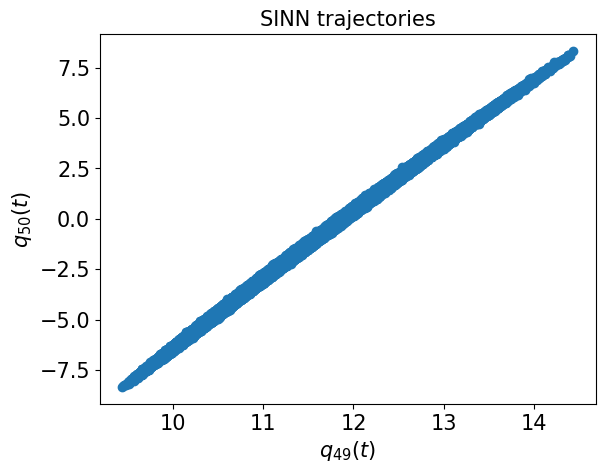

In [124]:
test6(model3)

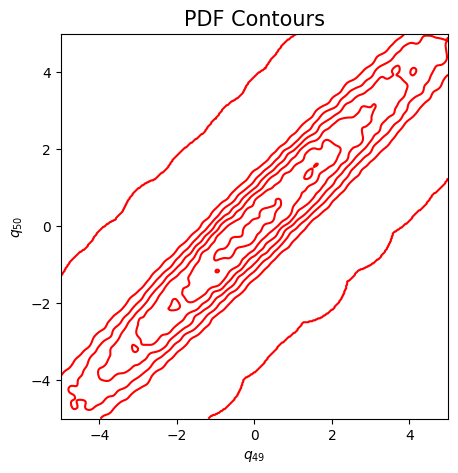

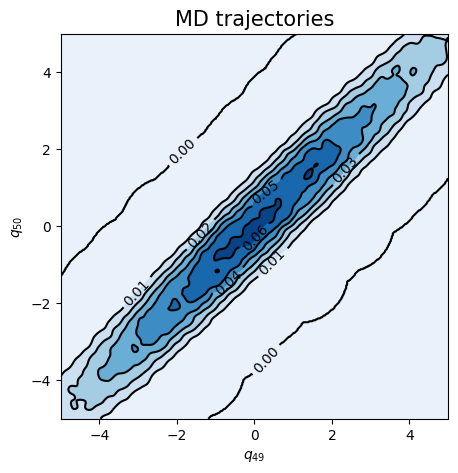

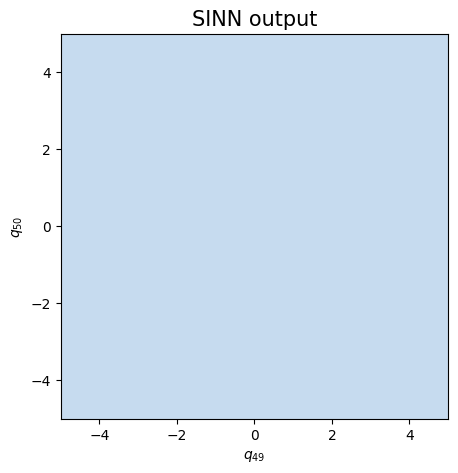

In [125]:
test7(model3)

In [126]:
### Defining SINN model
net4 = SINN(2, 150, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8339, 0.8200, acf: 0.09775, ccf: 0.09795, pdf: 0.29313, pdf2: 0.28962, acf2: 0.04155
[50]-th step loss: 0.2081, 0.2066, acf: 0.06555, ccf: 0.06542, pdf: 0.00829, pdf2: 0.04733, acf2: 0.01997
[100]-th step loss: 0.1024, 0.0742, acf: 0.00931, ccf: 0.00971, pdf: 0.00829, pdf2: 0.04476, acf2: 0.00214
[150]-th step loss: 0.0764, 0.0906, acf: 0.01836, ccf: 0.01898, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00024
[200]-th step loss: 0.0853, 0.0995, acf: 0.02248, ccf: 0.02268, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00124
[250]-th step loss: 0.0715, 0.0900, acf: 0.01823, ccf: 0.01826, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00049
[300]-th step loss: 0.0811, 0.0661, acf: 0.00491, ccf: 0.00489, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00326
[350]-th step loss: 0.5046, 0.4634, acf: 0.08031, ccf: 0.08044, pdf: 0.08209, pdf2: 0.06007, acf2: 0.16048
[400]-th step loss: 0.4366, 0.4366, acf: 0.08031, ccf: 0.08044, pdf: 0.10666, pdf2: 0.00874, acf2: 0.16049
[450]-th step loss: 0.4359, 0.4365, acf:

[3850]-th step loss: 0.4448, 0.4371, acf: 0.08031, ccf: 0.08044, pdf: 0.10717, pdf2: 0.00874, acf2: 0.16049
[3900]-th step loss: 0.4494, 0.4371, acf: 0.08031, ccf: 0.08044, pdf: 0.10717, pdf2: 0.00874, acf2: 0.16049
[3950]-th step loss: 0.4396, 0.4371, acf: 0.08031, ccf: 0.08044, pdf: 0.10717, pdf2: 0.00874, acf2: 0.16049
[4000]-th step loss: 0.4448, 0.4371, acf: 0.08031, ccf: 0.08044, pdf: 0.10717, pdf2: 0.00874, acf2: 0.16049
[4050]-th step loss: 0.4390, 0.4371, acf: 0.08031, ccf: 0.08044, pdf: 0.10717, pdf2: 0.00874, acf2: 0.16049
[4100]-th step loss: 0.4353, 0.4371, acf: 0.08031, ccf: 0.08044, pdf: 0.10717, pdf2: 0.00874, acf2: 0.16049
[4150]-th step loss: 0.4335, 0.4371, acf: 0.08031, ccf: 0.08044, pdf: 0.10717, pdf2: 0.00874, acf2: 0.16049
[4200]-th step loss: 0.4371, 0.4371, acf: 0.08031, ccf: 0.08044, pdf: 0.10717, pdf2: 0.00874, acf2: 0.16049
[4250]-th step loss: 0.4461, 0.4371, acf: 0.08031, ccf: 0.08044, pdf: 0.10717, pdf2: 0.00874, acf2: 0.16049
[4300]-th step loss: 0.4403,

[7650]-th step loss: 0.0443, 0.0438, acf: 0.01296, ccf: 0.01289, pdf: 0.00002, pdf2: 0.00001, acf2: 0.01790
[7700]-th step loss: 0.0408, 0.0413, acf: 0.01258, ccf: 0.01250, pdf: 0.00002, pdf2: 0.00001, acf2: 0.01621
[7750]-th step loss: 0.0410, 0.0414, acf: 0.01259, ccf: 0.01251, pdf: 0.00002, pdf2: 0.00001, acf2: 0.01630
[7800]-th step loss: 0.0402, 0.0410, acf: 0.01252, ccf: 0.01244, pdf: 0.00002, pdf2: 0.00001, acf2: 0.01600
[7850]-th step loss: 0.0404, 0.0421, acf: 0.01263, ccf: 0.01255, pdf: 0.00002, pdf2: 0.00001, acf2: 0.01687
[7900]-th step loss: 0.0408, 0.0404, acf: 0.01252, ccf: 0.01244, pdf: 0.00002, pdf2: 0.00001, acf2: 0.01540
[7950]-th step loss: 0.0400, 0.0434, acf: 0.01284, ccf: 0.01276, pdf: 0.00002, pdf2: 0.00001, acf2: 0.01776
[8000]-th step loss: 0.0443, 0.0439, acf: 0.01295, ccf: 0.01286, pdf: 0.00002, pdf2: 0.00001, acf2: 0.01806
[8050]-th step loss: 0.0407, 0.0431, acf: 0.01280, ccf: 0.01271, pdf: 0.00002, pdf2: 0.00001, acf2: 0.01757
[8100]-th step loss: 0.0406,

[11450]-th step loss: 0.0418, 0.0398, acf: 0.01223, ccf: 0.01213, pdf: 0.00000, pdf2: 0.00001, acf2: 0.01539
[11500]-th step loss: 0.0405, 0.0402, acf: 0.01244, ccf: 0.01233, pdf: 0.00000, pdf2: 0.00000, acf2: 0.01545
[11550]-th step loss: 0.0398, 0.0399, acf: 0.01217, ccf: 0.01208, pdf: 0.00001, pdf2: 0.00001, acf2: 0.01566
[11600]-th step loss: 0.0405, 0.0412, acf: 0.01230, ccf: 0.01221, pdf: 0.00001, pdf2: 0.00001, acf2: 0.01671
[11650]-th step loss: 0.0410, 0.0397, acf: 0.01215, ccf: 0.01206, pdf: 0.00001, pdf2: 0.00001, acf2: 0.01544
[11700]-th step loss: 0.0398, 0.0396, acf: 0.01214, ccf: 0.01205, pdf: 0.00002, pdf2: 0.00001, acf2: 0.01535
[11750]-th step loss: 0.0416, 0.0416, acf: 0.01235, ccf: 0.01226, pdf: 0.00001, pdf2: 0.00001, acf2: 0.01702
[11800]-th step loss: 0.0402, 0.0401, acf: 0.01217, ccf: 0.01207, pdf: 0.00001, pdf2: 0.00001, acf2: 0.01581
[11850]-th step loss: 0.0401, 0.0399, acf: 0.01220, ccf: 0.01210, pdf: 0.00001, pdf2: 0.00000, acf2: 0.01561
[11900]-th step los

[15250]-th step loss: 0.0379, 0.0388, acf: 0.01187, ccf: 0.01182, pdf: 0.00016, pdf2: 0.00008, acf2: 0.01490
[15300]-th step loss: 0.0379, 0.0368, acf: 0.01094, ccf: 0.01088, pdf: 0.00013, pdf2: 0.00007, acf2: 0.01480
[15350]-th step loss: 0.0226, 0.0272, acf: 0.01037, ccf: 0.01030, pdf: 0.00014, pdf2: 0.00006, acf2: 0.00634
[15400]-th step loss: 0.0265, 0.0271, acf: 0.00948, ccf: 0.00940, pdf: 0.00013, pdf2: 0.00008, acf2: 0.00807
[15450]-th step loss: 0.0112, 0.0061, acf: 0.00245, ccf: 0.00241, pdf: 0.00005, pdf2: 0.00004, acf2: 0.00116
[15500]-th step loss: 0.0115, 0.0067, acf: 0.00312, ccf: 0.00307, pdf: 0.00004, pdf2: 0.00005, acf2: 0.00041
[15550]-th step loss: 0.0080, 0.0046, acf: 0.00202, ccf: 0.00199, pdf: 0.00009, pdf2: 0.00006, acf2: 0.00045
[15600]-th step loss: 0.0399, 0.0324, acf: 0.01325, ccf: 0.01312, pdf: 0.00098, pdf2: 0.00032, acf2: 0.00469
[15650]-th step loss: 0.0868, 0.0344, acf: 0.01226, ccf: 0.01214, pdf: 0.00024, pdf2: 0.00008, acf2: 0.00970
[15700]-th step los

[19050]-th step loss: 0.2797, 0.2796, acf: 0.11341, ccf: 0.11304, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05310
[19100]-th step loss: 0.2796, 0.2795, acf: 0.11338, ccf: 0.11302, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05311
[19150]-th step loss: 0.2795, 0.2795, acf: 0.11337, ccf: 0.11301, pdf: 0.00000, pdf2: 0.00001, acf2: 0.05310
[19200]-th step loss: 0.2795, 0.2794, acf: 0.11331, ccf: 0.11295, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05313
[19250]-th step loss: 0.2794, 0.2794, acf: 0.11332, ccf: 0.11296, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05312
[19300]-th step loss: 0.1168, 0.2795, acf: 0.11337, ccf: 0.11301, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05313
[19350]-th step loss: 0.2792, 0.2795, acf: 0.11338, ccf: 0.11301, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05310
[19400]-th step loss: 0.2793, 0.2795, acf: 0.11337, ccf: 0.11301, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05312
[19450]-th step loss: 0.2796, 0.2795, acf: 0.11338, ccf: 0.11302, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05313
[19500]-th step los

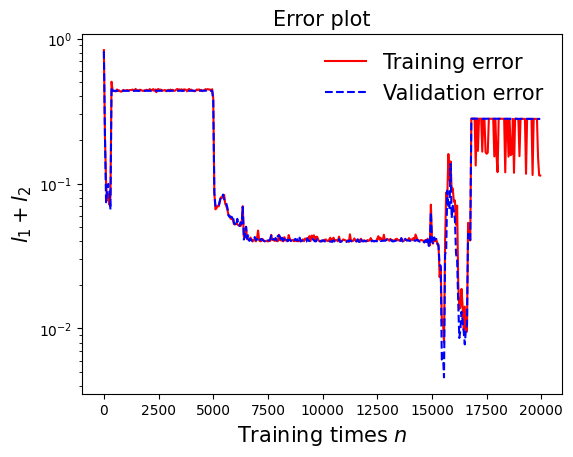

In [127]:
draw_loss(model4)

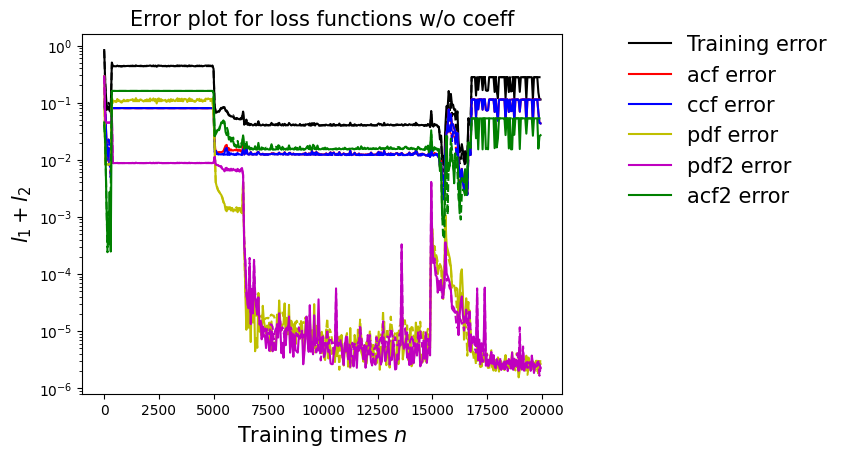

In [128]:
draw_errors(model4)

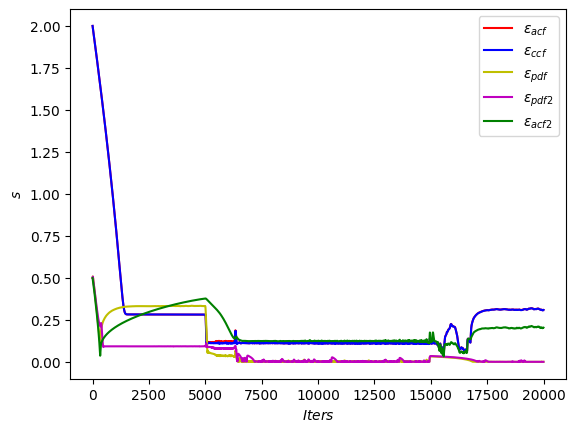

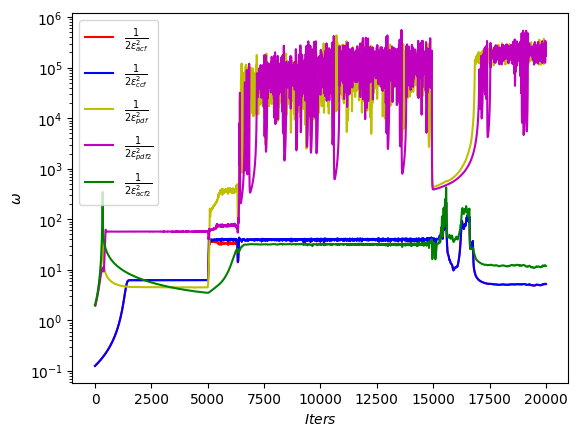

In [129]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

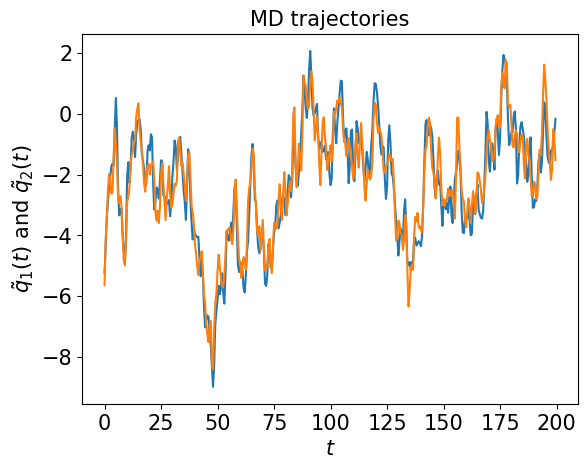

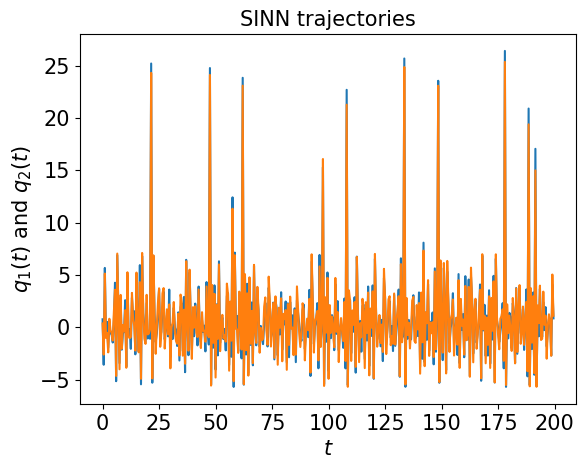

In [130]:
test1(model4)

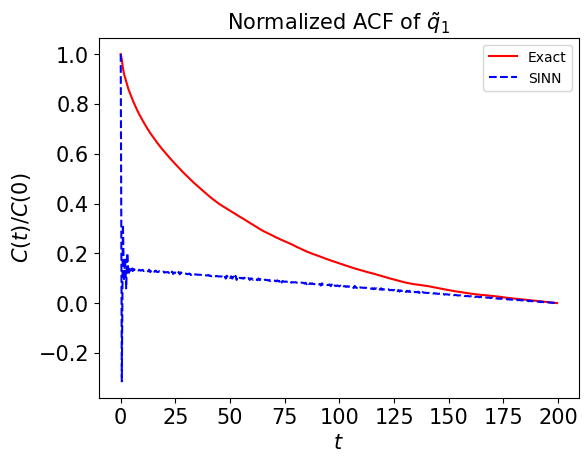

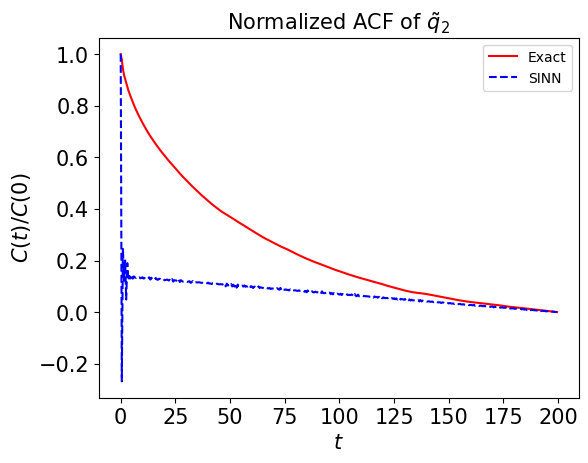

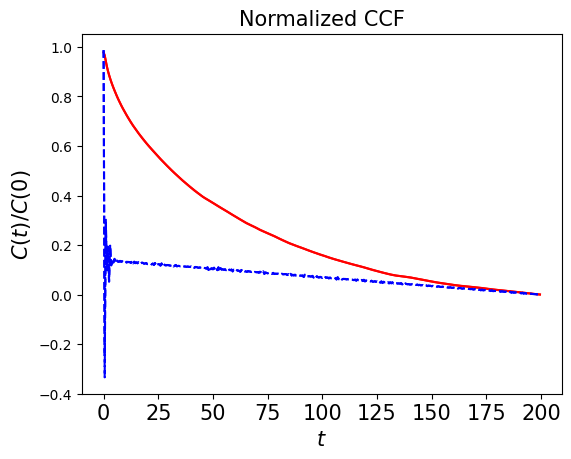

In [131]:
test2(model4)

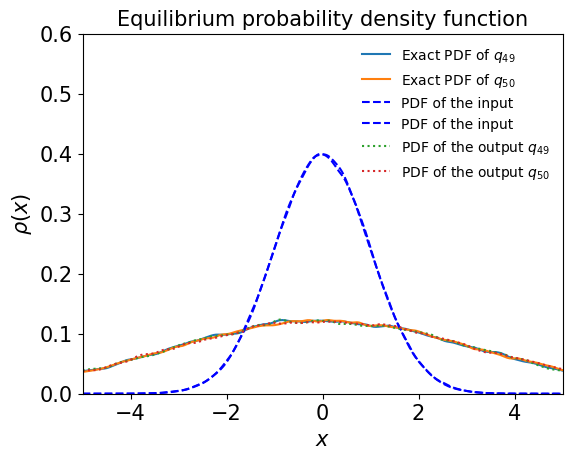

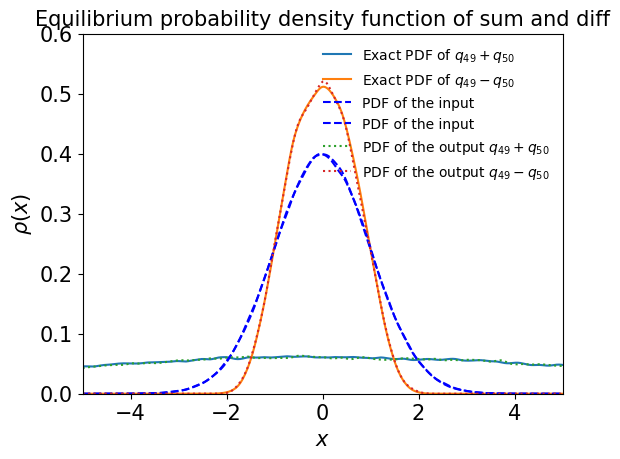

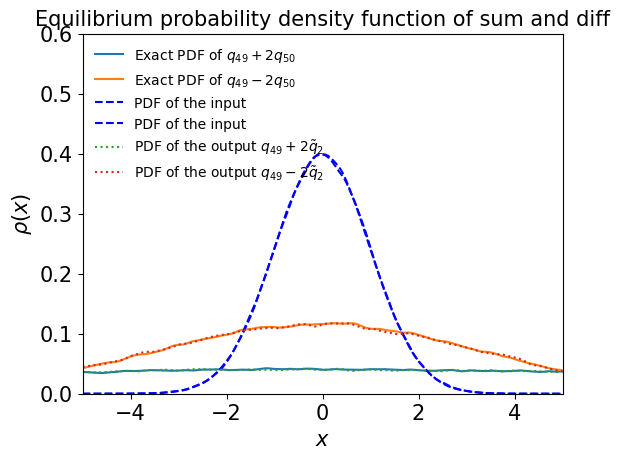

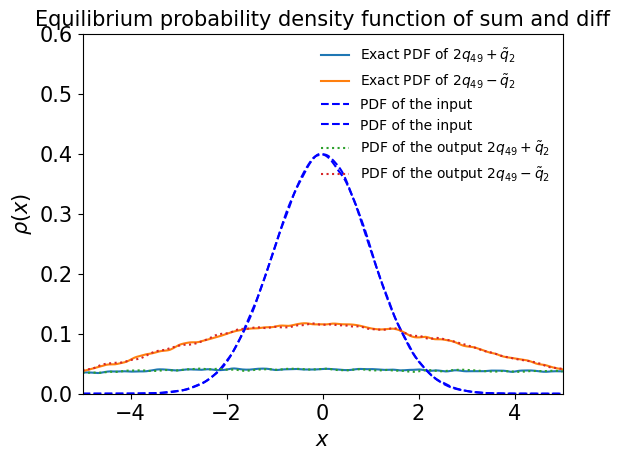

In [132]:
test3(model4)

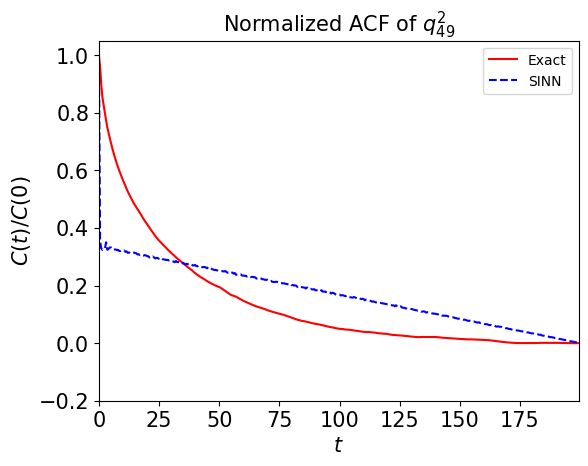

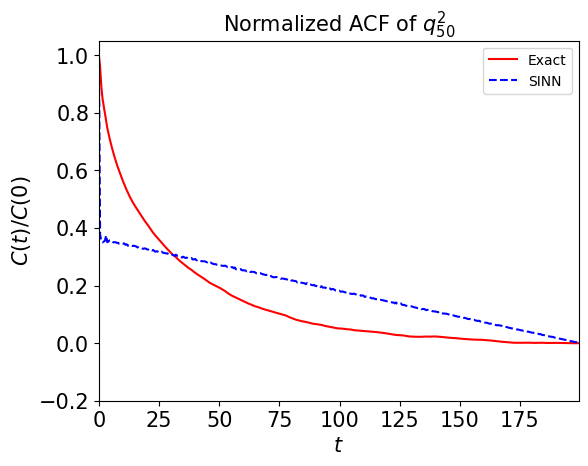

In [133]:
test4(model4)

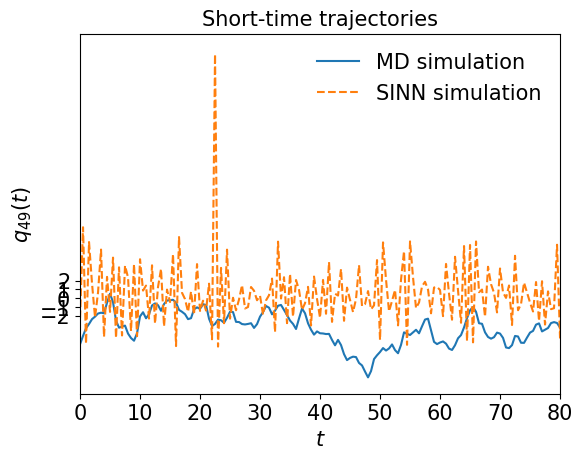

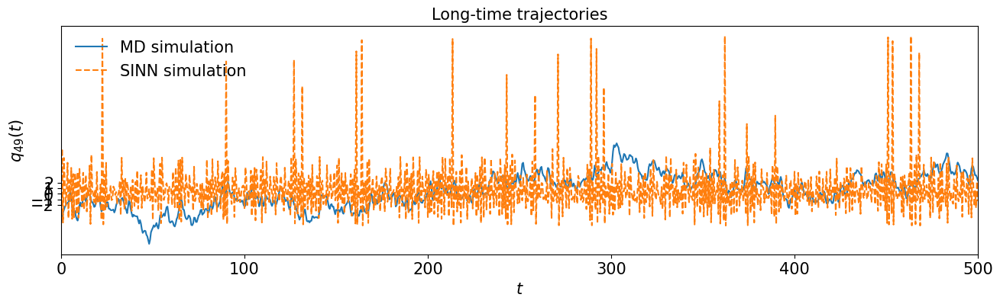

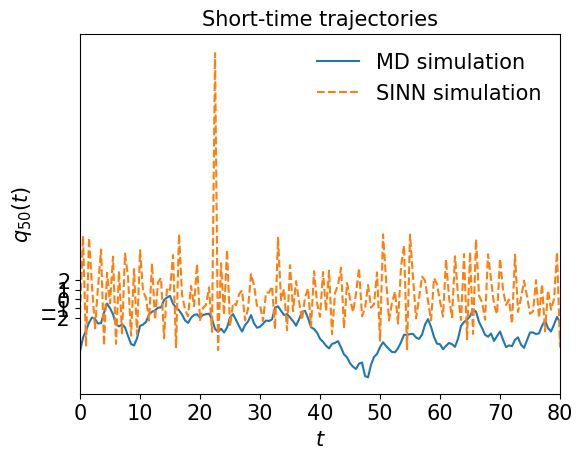

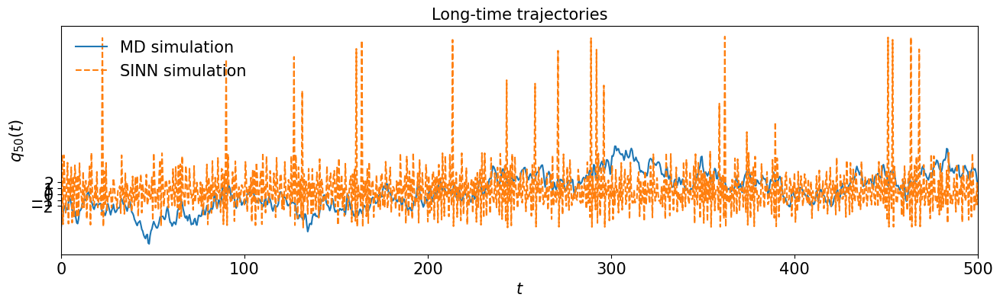

In [134]:
test5(model4)

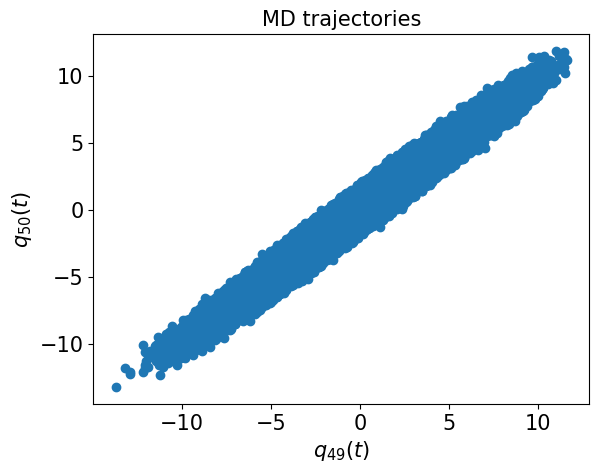

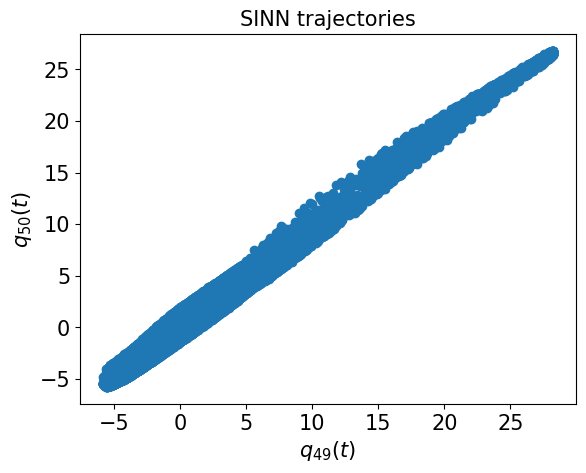

In [135]:
test6(model4)

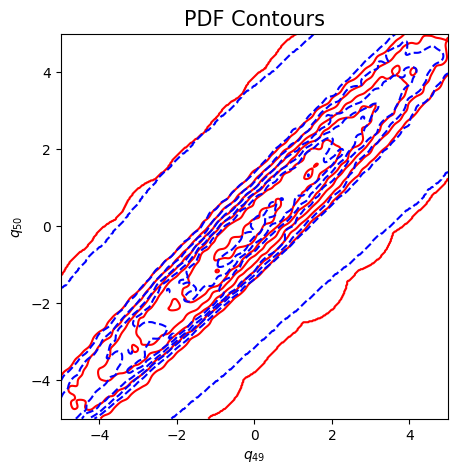

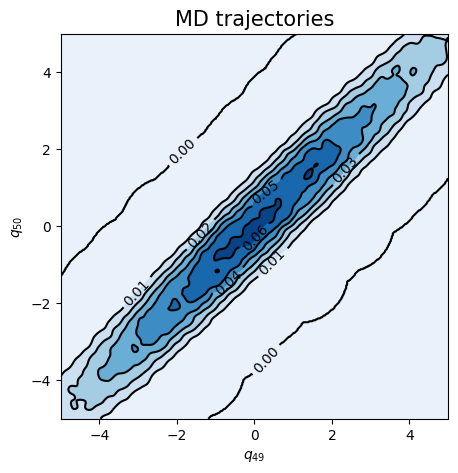

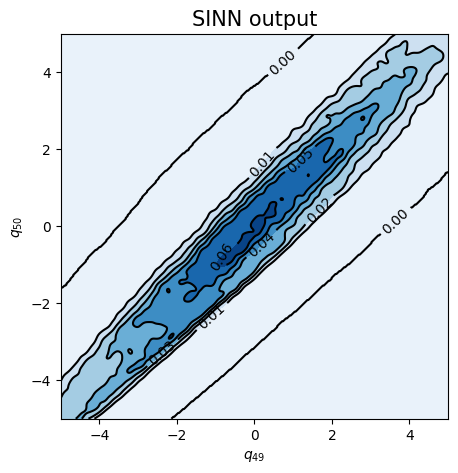

In [136]:
test7(model4)

In [137]:
### Defining SINN model
net5 = SINN(2, 150, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8590, 0.8309, acf: 0.09719, ccf: 0.10978, pdf: 0.29312, pdf2: 0.28978, acf2: 0.04104
[50]-th step loss: 0.0770, 0.0756, acf: 0.02430, ccf: 0.02423, pdf: 0.00892, pdf2: 0.00866, acf2: 0.00948
[100]-th step loss: 0.0830, 0.0730, acf: 0.03113, ccf: 0.03115, pdf: 0.00495, pdf2: 0.00245, acf2: 0.00335
[150]-th step loss: 0.0254, 0.0313, acf: 0.01484, ccf: 0.01483, pdf: 0.00030, pdf2: 0.00032, acf2: 0.00106
[200]-th step loss: 0.1089, 0.0955, acf: 0.03523, ccf: 0.03516, pdf: 0.00397, pdf2: 0.01644, acf2: 0.00469
[250]-th step loss: 0.0236, 0.0394, acf: 0.01788, ccf: 0.01775, pdf: 0.00038, pdf2: 0.00034, acf2: 0.00303
[300]-th step loss: 0.1552, 0.1568, acf: 0.07074, ccf: 0.07054, pdf: 0.00022, pdf2: 0.00024, acf2: 0.01508
[350]-th step loss: 0.2983, 0.2976, acf: 0.12302, ccf: 0.12275, pdf: 0.00038, pdf2: 0.00021, acf2: 0.05123
[400]-th step loss: 0.2789, 0.2790, acf: 0.11542, ccf: 0.11516, pdf: 0.00001, pdf2: 0.00004, acf2: 0.04834
[450]-th step loss: 0.1599, 0.1313, acf:

[3850]-th step loss: 0.0220, 0.0236, acf: 0.00028, ccf: 0.00029, pdf: 0.00796, pdf2: 0.00351, acf2: 0.01157
[3900]-th step loss: 0.0259, 0.0228, acf: 0.00010, ccf: 0.00010, pdf: 0.00778, pdf2: 0.00344, acf2: 0.01141
[3950]-th step loss: 0.0275, 0.0277, acf: 0.00004, ccf: 0.00004, pdf: 0.00808, pdf2: 0.00359, acf2: 0.01598
[4000]-th step loss: 0.0372, 0.0358, acf: 0.00031, ccf: 0.00020, pdf: 0.00962, pdf2: 0.00682, acf2: 0.01886
[4050]-th step loss: 0.0219, 0.0210, acf: 0.00104, ccf: 0.00103, pdf: 0.00775, pdf2: 0.00337, acf2: 0.00781
[4100]-th step loss: 0.0233, 0.0223, acf: 0.00060, ccf: 0.00059, pdf: 0.00813, pdf2: 0.00481, acf2: 0.00813
[4150]-th step loss: 0.0227, 0.0268, acf: 0.00004, ccf: 0.00003, pdf: 0.00751, pdf2: 0.00337, acf2: 0.01589
[4200]-th step loss: 0.0225, 0.0214, acf: 0.00042, ccf: 0.00041, pdf: 0.00771, pdf2: 0.00338, acf2: 0.00950
[4250]-th step loss: 0.0243, 0.0232, acf: 0.00027, ccf: 0.00028, pdf: 0.00760, pdf2: 0.00343, acf2: 0.01166
[4300]-th step loss: 0.0196,

[7650]-th step loss: 0.0161, 0.0144, acf: 0.00013, ccf: 0.00015, pdf: 0.00623, pdf2: 0.00349, acf2: 0.00444
[7700]-th step loss: 0.0133, 0.0134, acf: 0.00028, ccf: 0.00019, pdf: 0.00641, pdf2: 0.00354, acf2: 0.00295
[7750]-th step loss: 0.0151, 0.0151, acf: 0.00003, ccf: 0.00003, pdf: 0.00628, pdf2: 0.00391, acf2: 0.00488
[7800]-th step loss: 0.0156, 0.0148, acf: 0.00005, ccf: 0.00004, pdf: 0.00646, pdf2: 0.00344, acf2: 0.00480
[7850]-th step loss: 0.0149, 0.0165, acf: 0.00011, ccf: 0.00009, pdf: 0.00573, pdf2: 0.00444, acf2: 0.00610
[7900]-th step loss: 0.0147, 0.0145, acf: 0.00003, ccf: 0.00002, pdf: 0.00676, pdf2: 0.00340, acf2: 0.00426
[7950]-th step loss: 0.0134, 0.0158, acf: 0.00007, ccf: 0.00007, pdf: 0.00610, pdf2: 0.00365, acf2: 0.00592
[8000]-th step loss: 0.0135, 0.0153, acf: 0.00006, ccf: 0.00002, pdf: 0.00637, pdf2: 0.00362, acf2: 0.00520
[8050]-th step loss: 0.0196, 0.0176, acf: 0.00025, ccf: 0.00024, pdf: 0.00593, pdf2: 0.00632, acf2: 0.00487
[8100]-th step loss: 0.0223,

[11450]-th step loss: 0.0119, 0.0095, acf: 0.00004, ccf: 0.00002, pdf: 0.00512, pdf2: 0.00419, acf2: 0.00014
[11500]-th step loss: 0.0098, 0.0099, acf: 0.00013, ccf: 0.00009, pdf: 0.00578, pdf2: 0.00367, acf2: 0.00023
[11550]-th step loss: 0.0101, 0.0104, acf: 0.00034, ccf: 0.00027, pdf: 0.00529, pdf2: 0.00395, acf2: 0.00055
[11600]-th step loss: 0.0095, 0.0096, acf: 0.00010, ccf: 0.00007, pdf: 0.00530, pdf2: 0.00393, acf2: 0.00023
[11650]-th step loss: 0.0106, 0.0103, acf: 0.00013, ccf: 0.00008, pdf: 0.00562, pdf2: 0.00400, acf2: 0.00043
[11700]-th step loss: 0.0098, 0.0097, acf: 0.00005, ccf: 0.00002, pdf: 0.00571, pdf2: 0.00371, acf2: 0.00015
[11750]-th step loss: 0.0102, 0.0115, acf: 0.00059, ccf: 0.00055, pdf: 0.00493, pdf2: 0.00473, acf2: 0.00066
[11800]-th step loss: 0.0109, 0.0115, acf: 0.00051, ccf: 0.00050, pdf: 0.00473, pdf2: 0.00491, acf2: 0.00089
[11850]-th step loss: 0.0100, 0.0094, acf: 0.00005, ccf: 0.00004, pdf: 0.00547, pdf2: 0.00367, acf2: 0.00016
[11900]-th step los

[15250]-th step loss: 0.0093, 0.0094, acf: 0.00009, ccf: 0.00006, pdf: 0.00529, pdf2: 0.00382, acf2: 0.00015
[15300]-th step loss: 0.0107, 0.0105, acf: 0.00025, ccf: 0.00012, pdf: 0.00444, pdf2: 0.00561, acf2: 0.00012
[15350]-th step loss: 0.0096, 0.0097, acf: 0.00014, ccf: 0.00012, pdf: 0.00556, pdf2: 0.00367, acf2: 0.00018
[15400]-th step loss: 0.0094, 0.0096, acf: 0.00009, ccf: 0.00007, pdf: 0.00570, pdf2: 0.00352, acf2: 0.00022
[15450]-th step loss: 0.0096, 0.0102, acf: 0.00034, ccf: 0.00031, pdf: 0.00526, pdf2: 0.00388, acf2: 0.00043
[15500]-th step loss: 0.0096, 0.0095, acf: 0.00006, ccf: 0.00003, pdf: 0.00573, pdf2: 0.00361, acf2: 0.00010
[15550]-th step loss: 0.0128, 0.0106, acf: 0.00026, ccf: 0.00018, pdf: 0.00615, pdf2: 0.00384, acf2: 0.00017
[15600]-th step loss: 0.0107, 0.0105, acf: 0.00009, ccf: 0.00007, pdf: 0.00657, pdf2: 0.00361, acf2: 0.00012
[15650]-th step loss: 0.0104, 0.0104, acf: 0.00019, ccf: 0.00015, pdf: 0.00595, pdf2: 0.00368, acf2: 0.00047
[15700]-th step los

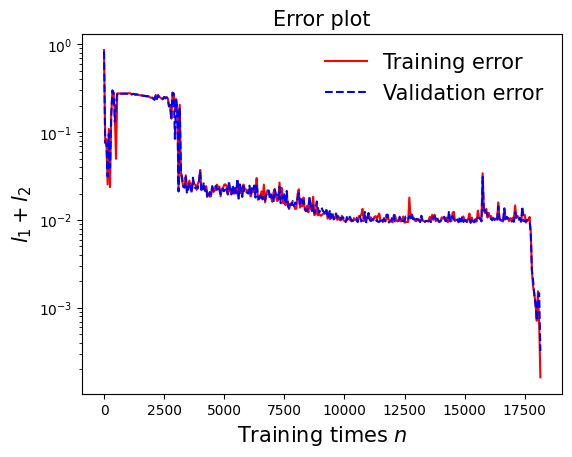

In [138]:
draw_loss(model5)

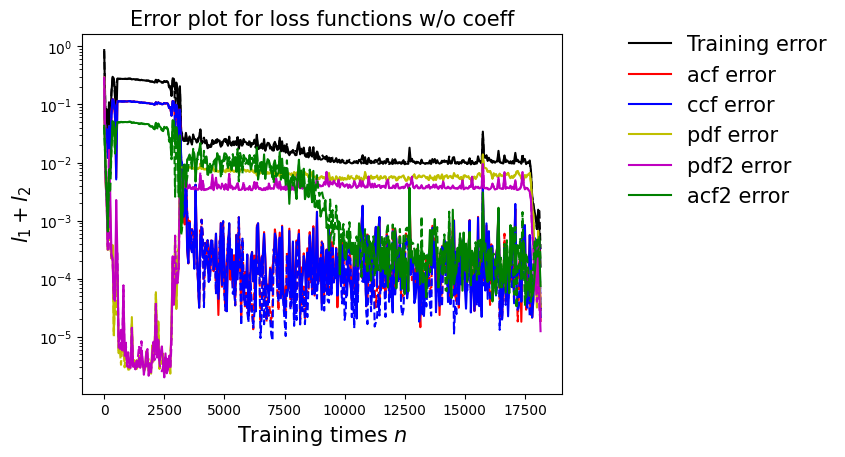

In [139]:
draw_errors(model5)

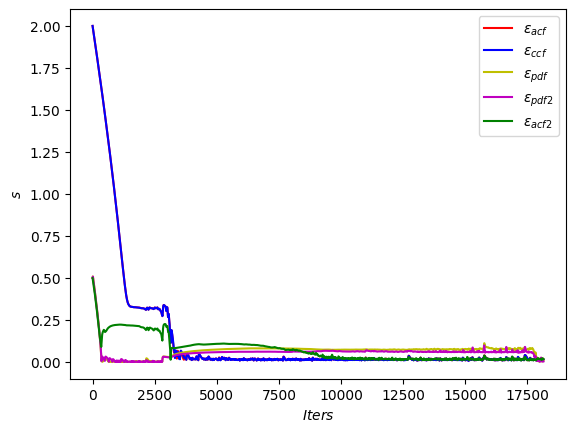

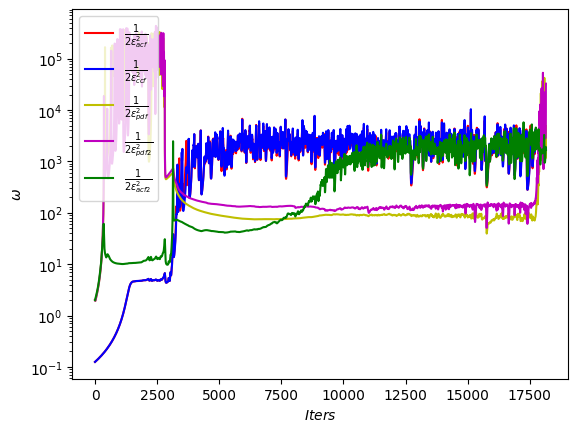

In [140]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

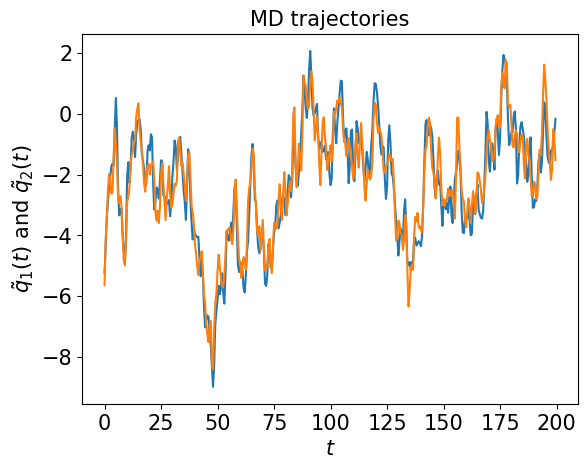

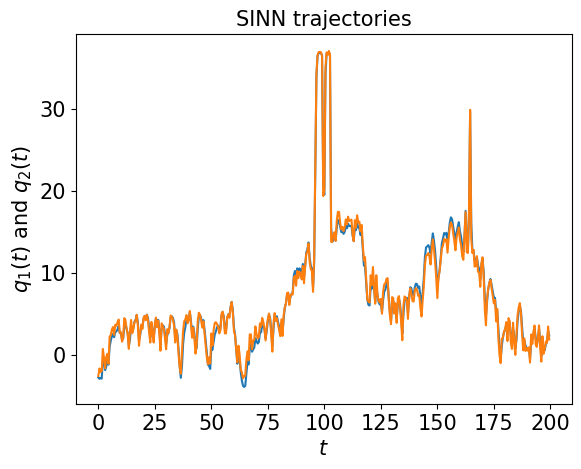

In [141]:
test1(model5)

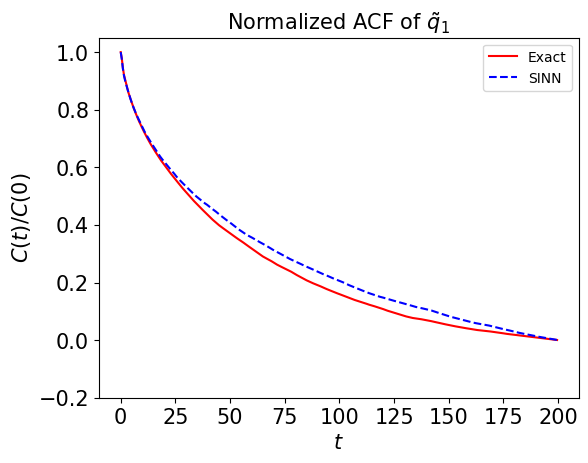

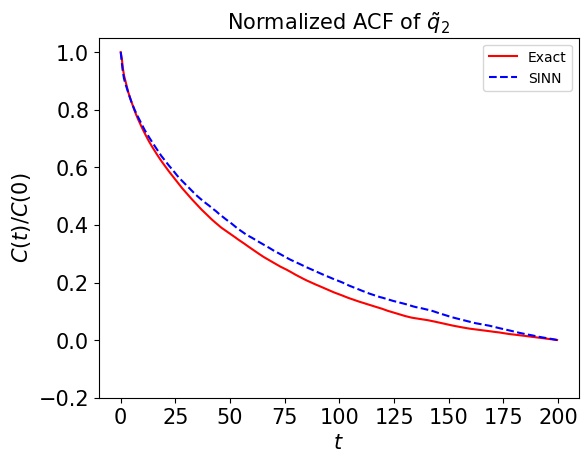

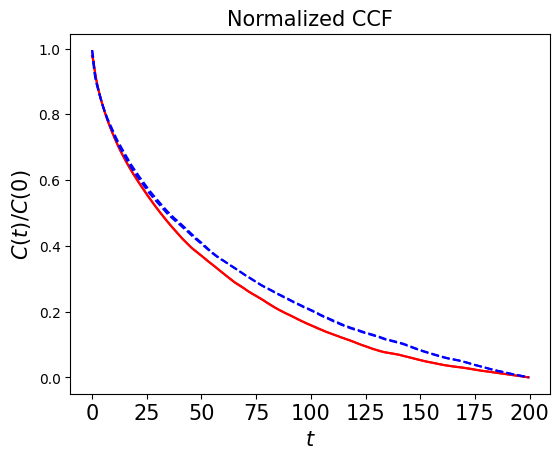

In [142]:
test2(model5)

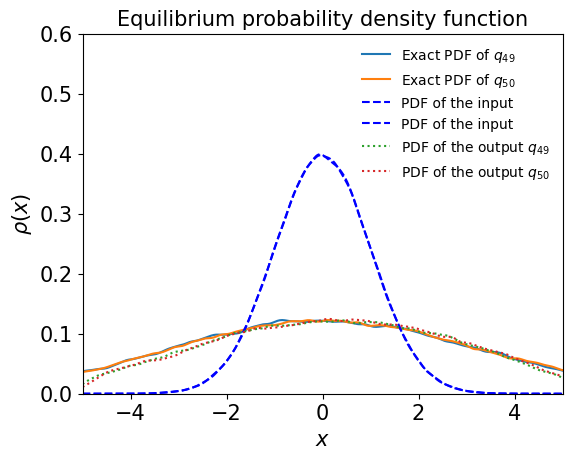

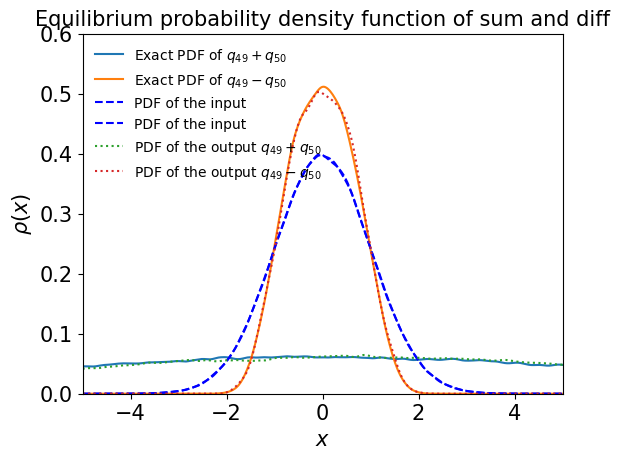

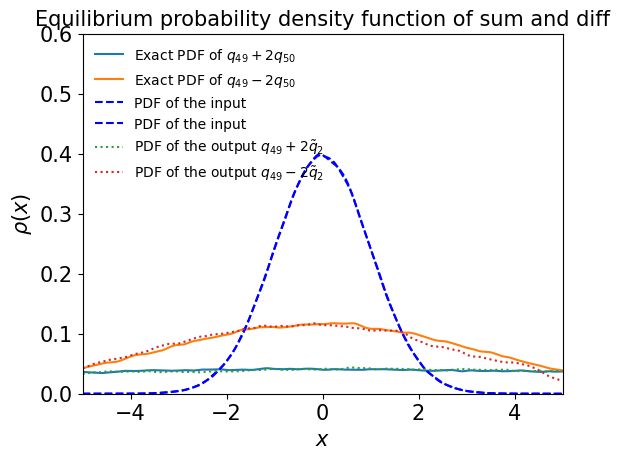

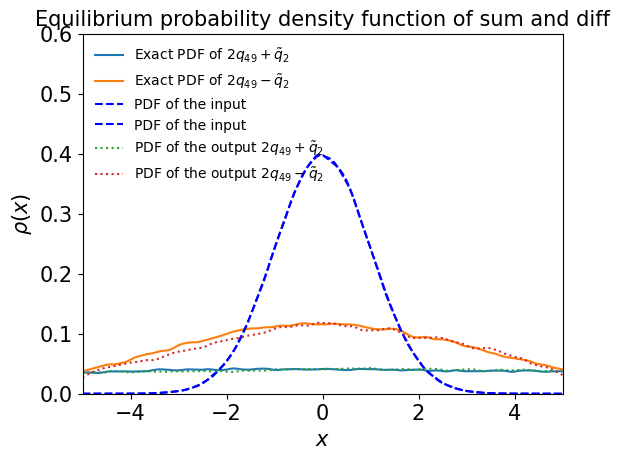

In [143]:
test3(model5)

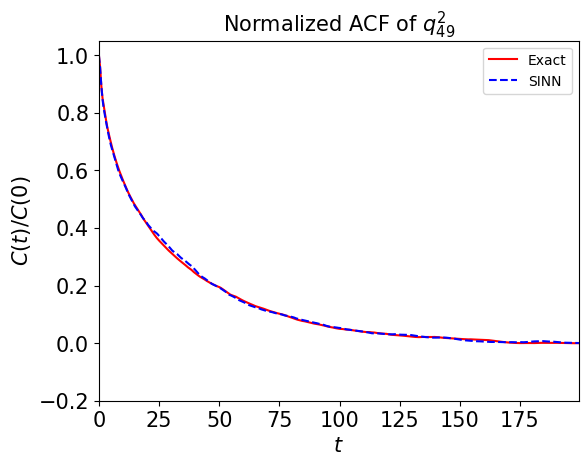

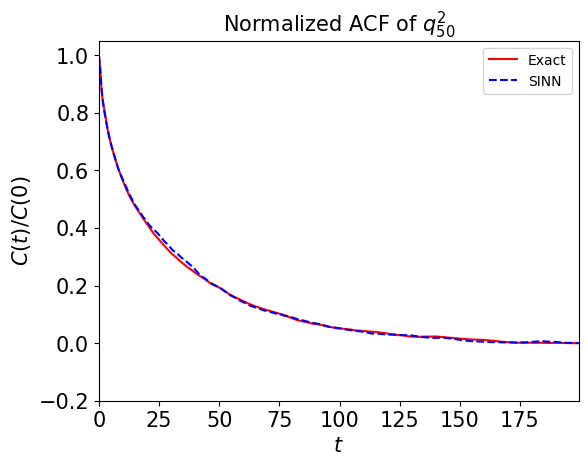

In [144]:
test4(model5)

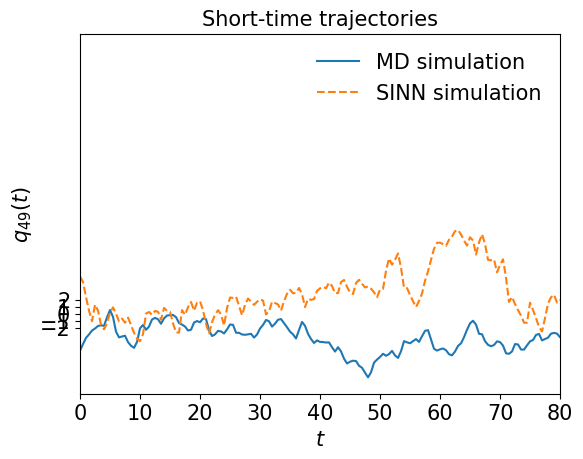

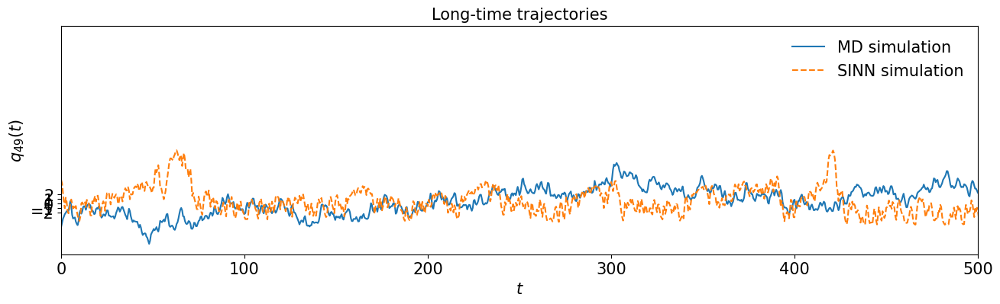

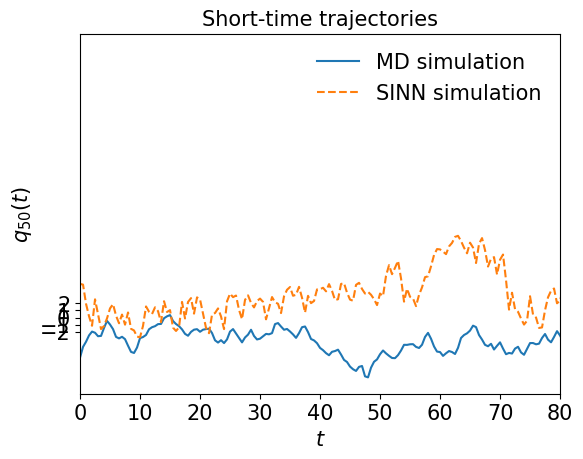

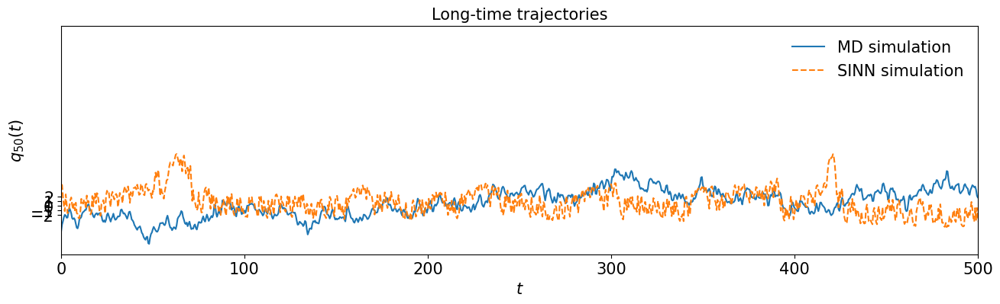

In [145]:
test5(model5)

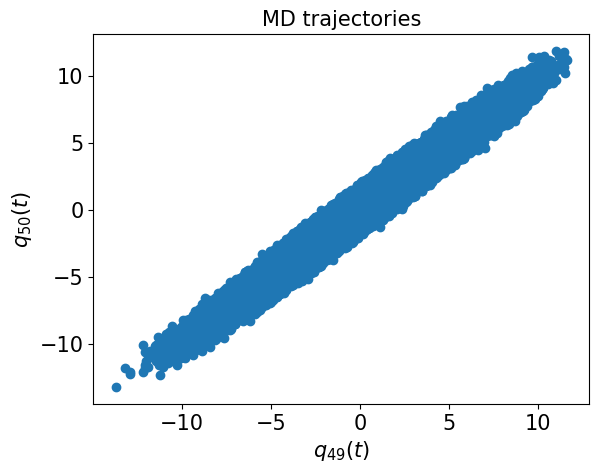

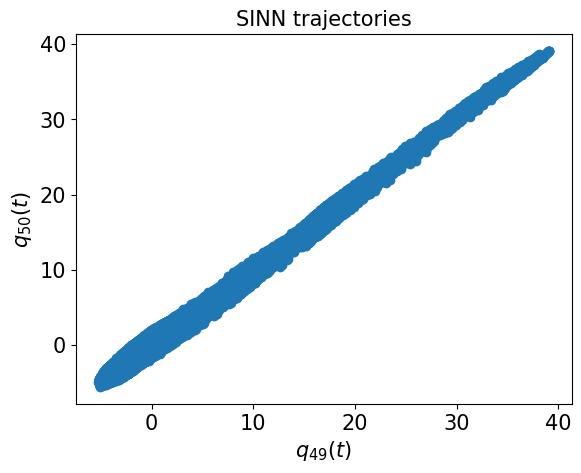

In [146]:
test6(model5)

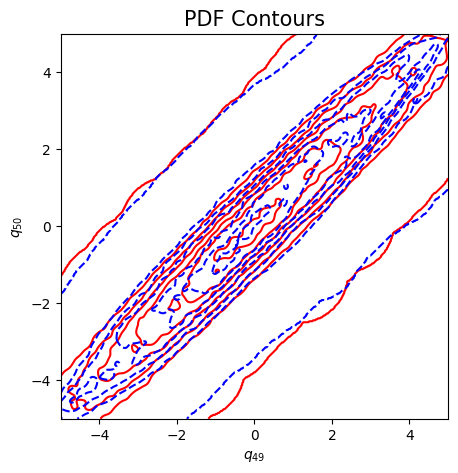

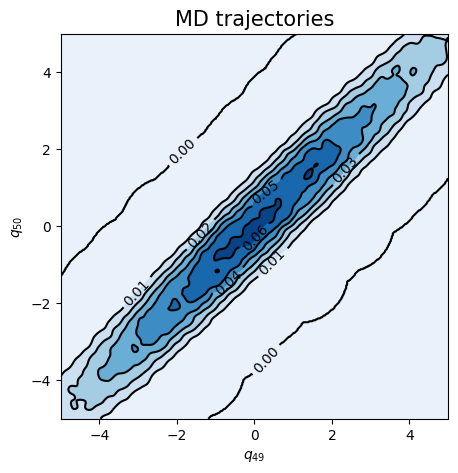

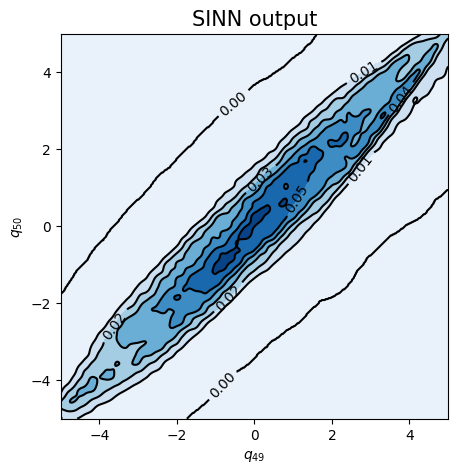

In [147]:
test7(model5)

In [148]:
### Defining SINN model
net6 = SINN(2, 150, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.8600, 0.8328, acf: 0.09716, ccf: 0.11169, pdf: 0.29307, pdf2: 0.28983, acf2: 0.04103
[50]-th step loss: 0.1986, 0.1895, acf: 0.07199, ccf: 0.07196, pdf: 0.01468, pdf2: 0.00809, acf2: 0.02275
[100]-th step loss: 0.0287, 0.0181, acf: 0.00795, ccf: 0.00783, pdf: 0.00071, pdf2: 0.00068, acf2: 0.00096
[150]-th step loss: 0.0308, 0.0271, acf: 0.01146, ccf: 0.01141, pdf: 0.00166, pdf2: 0.00144, acf2: 0.00117
[200]-th step loss: 0.0197, 0.0123, acf: 0.00471, ccf: 0.00470, pdf: 0.00011, pdf2: 0.00015, acf2: 0.00269
[250]-th step loss: 0.0654, 0.0605, acf: 0.02668, ccf: 0.02663, pdf: 0.00349, pdf2: 0.00272, acf2: 0.00094
[300]-th step loss: 0.0666, 0.0793, acf: 0.03514, ccf: 0.03536, pdf: 0.00463, pdf2: 0.00289, acf2: 0.00130
[350]-th step loss: 0.0160, 0.0217, acf: 0.01041, ccf: 0.01041, pdf: 0.00021, pdf2: 0.00040, acf2: 0.00030
[400]-th step loss: 0.0377, 0.0331, acf: 0.01629, ccf: 0.01636, pdf: 0.00018, pdf2: 0.00009, acf2: 0.00017
[450]-th step loss: 0.0450, 0.0415, acf:

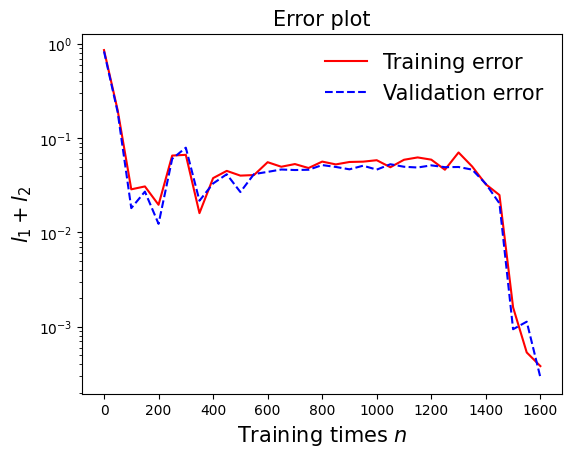

In [149]:
draw_loss(model6)

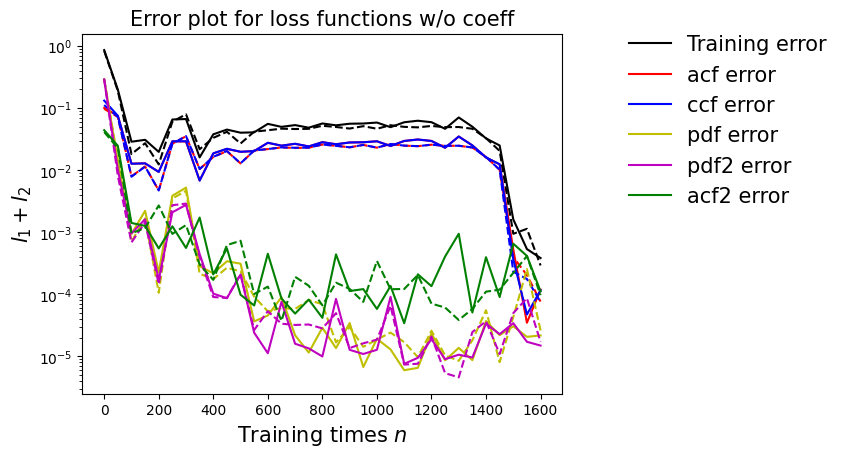

In [150]:
draw_errors(model6)

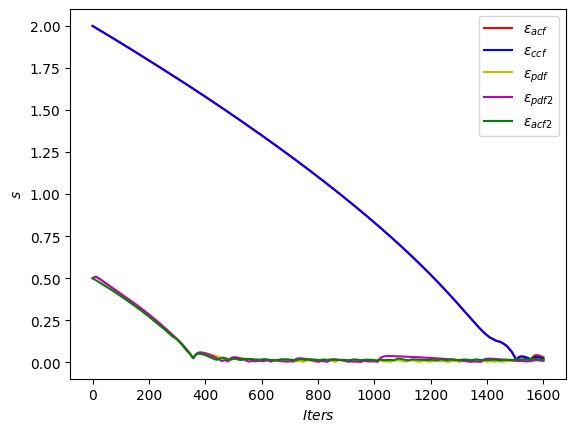

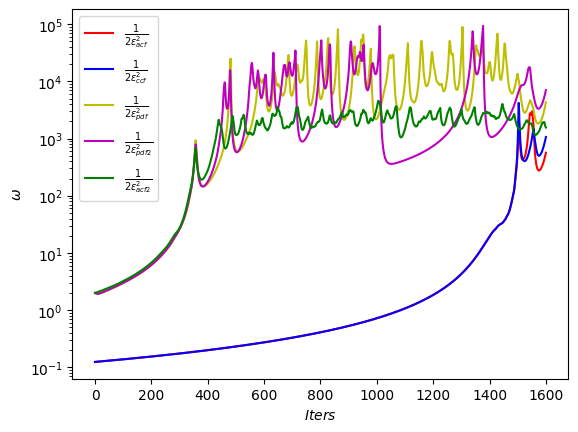

In [151]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

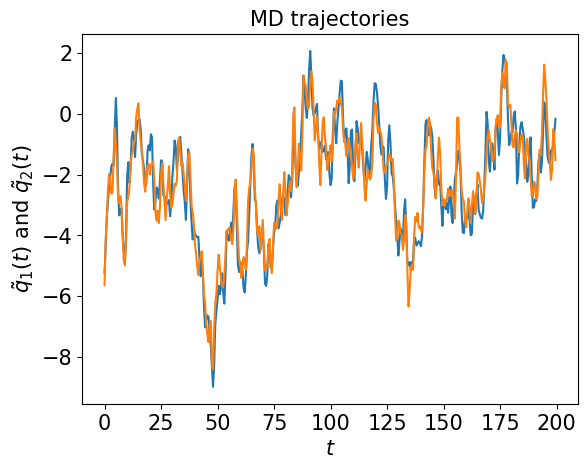

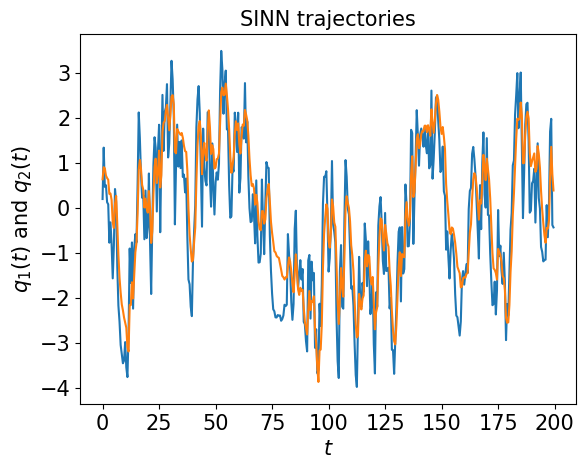

In [152]:
test1(model6)

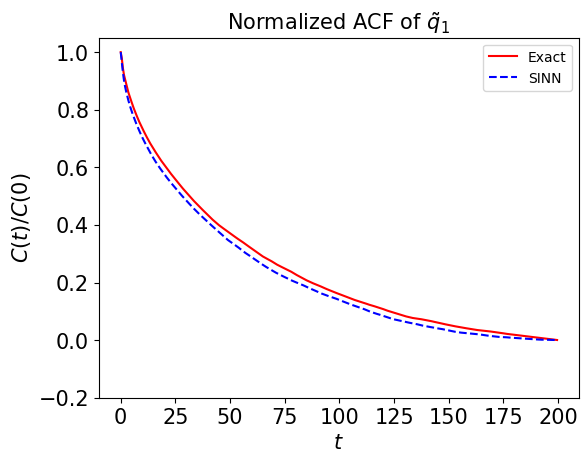

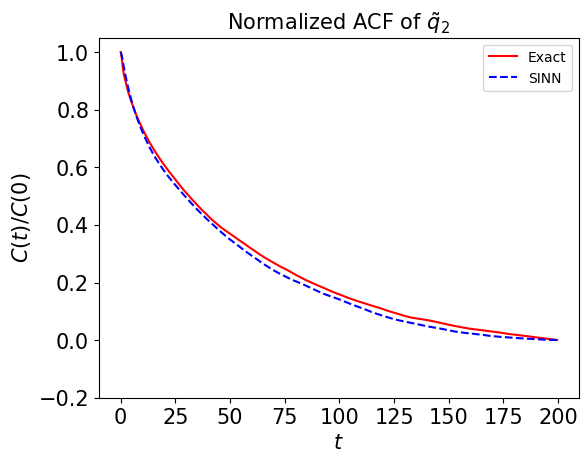

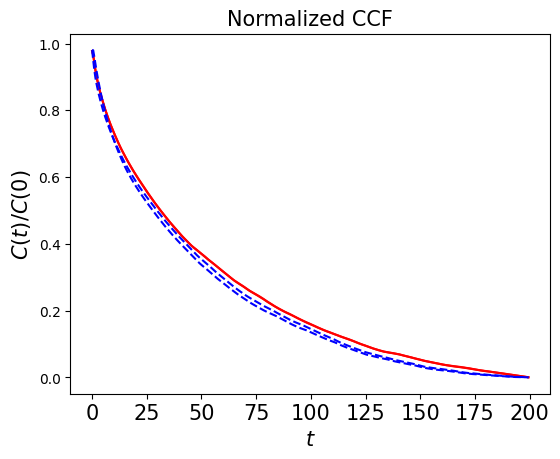

In [153]:
test2(model6)

In [ ]:
test3(model6)

In [ ]:
test4(model6)

In [ ]:
test5(model6)

In [ ]:
test6(model6)

In [ ]:
test7(model6)

In [ ]:
### Defining SINN model
net7 = SINN(2, 150, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

In [ ]:
draw_loss(model7)

In [ ]:
draw_errors(model7)

In [ ]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

In [ ]:
test1(model7)

In [ ]:
test2(model7)

In [ ]:
test3(model7)

In [ ]:
test4(model7)

In [ ]:
test5(model7)

In [ ]:
test6(model7)

In [ ]:
test7(model7)

In [ ]:
### Defining SINN model
net8 = SINN(2, 150, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

In [ ]:
draw_loss(model8)

In [ ]:
draw_errors(model8)

In [ ]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

In [ ]:
test1(model8)

In [ ]:
test2(model8)

In [ ]:
test3(model8)

In [ ]:
test4(model8)

In [ ]:
test5(model8)

In [ ]:
test6(model8)

In [ ]:
test7(model8)

In [ ]:
### Defining SINN model
net9 = SINN(2, 150, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

In [ ]:
draw_loss(model9)

In [ ]:
draw_errors(model9)

In [ ]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

In [ ]:
test1(model9)

In [ ]:
test2(model9)

In [ ]:
test3(model9)

In [ ]:
test4(model9)

In [ ]:
test5(model9)

In [ ]:
test6(model9)

In [ ]:
test7(model9)